<a href="https://colab.research.google.com/github/kenichinakanishi/houseplant_classifier/blob/master/Image_Scraper_Master_v6_CrossRef_Clean.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Web Data Scraping

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
from urllib.request import Request, urlopen
from bs4 import BeautifulSoup

def getHTMLContent(link):
    html = urlopen(link)
    soup = BeautifulSoup(html, 'html.parser')
    return soup

Grab data for cats.

In [3]:
req = Request('https://www.aspca.org/pet-care/animal-poison-control/cats-plant-list', headers={'User-Agent': 'Mozilla/5.0'})
webpage = urlopen(req).read()
# Soupify the webpage
soup = BeautifulSoup(webpage, 'lxml')       
# Search through the parse tree to get all the content from the table         
content_list = soup.find_all('span')[7:-4]       
# Put it in a dataframe for further processing
df_cats = pd.DataFrame(content_list)           

In [4]:
# Clean up the strings
df_cats[0] = df_cats[0].apply(lambda x: str(x).split('>')[1][:-3])
df_cats[4] = df_cats[4].apply(lambda x: str(x).split('>')[1][:-3])
df_cats[1] = df_cats[1].apply(lambda x: str(x).split('(')[1][0:-4])
# Get rid of useless columns and rename the columns
df_cats = df_cats.drop(columns=[2,3,5,6]).rename(columns = {0:'Name',1:'Alternative Names',4:'Scientific Name',7:'Family'})
# Separate toxic and non-toxic plants
df_cats['Toxic to Cats'] = True
first_nontoxic_cats = [index for index in df_cats[df_cats['Name'].str.startswith('A')].index if index>100][0]
df_cats.loc[first_nontoxic_cats:,'Toxic to Cats'] = False

Same thing for dogs.

In [5]:
req = Request('https://www.aspca.org/pet-care/animal-poison-control/dogs-plant-list', headers={'User-Agent': 'Mozilla/5.0'})
webpage = urlopen(req).read()
soup = BeautifulSoup(webpage, 'lxml')                 # soupify the webpage
content_list = soup.find_all('span')[7:-4]            # Get all the content from the table
df_dogs = pd.DataFrame(content_list)                  # Put it in a dataframe for processing

In [6]:
# Clean up the strings
df_dogs[0] = df_dogs[0].apply(lambda x: str(x).split('>')[1][:-3])
df_dogs[4] = df_dogs[4].apply(lambda x: str(x).split('>')[1][:-3])
df_dogs[1] = df_dogs[1].apply(lambda x: str(x).split('(')[1][0:-4])
# Get rid of useless columns and rename the columns
df_dogs = df_dogs.drop(columns=[2,3,5,6]).rename(columns = {0:'Name',1:'Alternative Names',4:'Scientific Name',7:'Family'})
# Separate toxic and non-toxic plants
df_dogs['Toxic to Dogs'] = True
first_nontoxic_dogs = [index for index in df_dogs[df_dogs['Name'].str.startswith('A')].index if index>100][0]
df_dogs.loc[first_nontoxic_dogs:,'Toxic to Dogs'] = False

Merge data into one master dataframe. 

In [7]:
# Merge dataframes into one, outer merge used to retain values that only exist on one side
df_catsdogs = df_dogs.merge(df_cats, how='outer', on=['Name','Alternative Names','Scientific Name','Family'])
df_catsdogs = df_catsdogs.fillna('Unknown')
aspca_df = df_catsdogs.copy()
# Assume same toxicity for dogs and cats if unknown
aspca_df['Toxic to Cats'] = aspca_df.apply(lambda x: x['Toxic to Dogs'] if (x['Toxic to Cats'] == 'Unknown') else x['Toxic to Cats'], axis=1)
aspca_df['Toxic to Dogs'] = aspca_df.apply(lambda x: x['Toxic to Cats'] if (x['Toxic to Dogs'] == 'Unknown') else x['Toxic to Dogs'], axis=1)

In [8]:
aspca_df.sample(10)

,Name,Alternative Names,Scientific Name,Family,Toxic to Dogs,Toxic to Cats
821,Poison Sumac,"Similar: Poison Ivy, Poison Oak",Toxicodendron species,Anacardiaceae,False,False
864,Sand Lily,"mountain lily, star lily",Leucocrinum montanum,Liliaceae,False,False
200,Jade Plant,"Baby Jade, Dwarf rubber plant, Jade tree, Chin...",Crassula argentea,Crassulaceae,True,True
243,Mayweed,"Poison Daisy, Stinking Chamomile",Anthemis cotula,Asteraceae,True,True
750,Mockernut Hickory,Squarenut,Carya tomentosa,Juglandaceae,False,False
333,Sago Palm,"Coontie Palm, Cardboard Palm, cycads and zamias","Cycas revoluta, zamia species",Cycadaceae,True,True
766,Muscari Armeniacum,Grape Hyacinth,Muscari armeniacum,Hyacinthaceae,False,False
195,Inkberry,"English Holly, European Holly, Oregon Holly, A...",Ilex opaca,Aquifoliaceae,True,True
749,Mistletoe Cactus,,Rhipsalis cassutha,Cactaceae,False,False
699,King and Queen Fern,"Hen and Chickens Fern, Spleenwort, Parsley fern",Asplenium bulbiferum,Polypodaceae,False,False


# Data Cleanup

In [9]:
aspca_df = aspca_df.drop_duplicates('Scientific Name') # Get rid of duplicates
aspca_df = aspca_df.reset_index(drop=True).sort_index()   # Reset and sort index

In [10]:
aspca_df = aspca_df.drop(aspca_df[aspca_df['Scientific Name'].isin(['','NONE LISTED'])].index,axis=0).reset_index(drop=True).sort_index()    # Fix mistakes in database

In [11]:
# Ensure proper punctuation for each scientific name.
def normalize_capitalization(x):
  first_word, rest = x.split()[0], x.split()[1:]
  first_word = [first_word.capitalize()]
  rest = [word.lower() for word in rest]
  return ' '.join(first_word+rest)

# Clean up repeated species that have different names
def species_normalizer(word):
  if word.split()[-1] in ['sp','species','spp','sp.','spp.']:
    word = ''.join(word.split()[:-1])
  return word

# Remove cv from names, as it is an outdated way of referring to cultivars
def cv_remover(word):
  if 'cv' in word:
    word = word.replace(' cv ',' ')
  return word

# Remove var. from names
def var_remover(word):
  if 'var' in word:
    word = word.replace(' var. ',' ')
  return word

# Apply each of the functions
aspca_df['Scientific Name'] = aspca_df['Scientific Name'].apply(normalize_capitalization)
aspca_df['Scientific Name'] = aspca_df['Scientific Name'].apply(species_normalizer)
aspca_df['Scientific Name'] = aspca_df['Scientific Name'].apply(cv_remover)
aspca_df['Scientific Name'] = aspca_df['Scientific Name'].apply(var_remover)

# Remove special characters
aspca_df['Scientific Name'] = aspca_df['Scientific Name'].apply(lambda x: ''.join([character for character in x if character.isalnum() or character.isspace()]))

# Reset dataframe for further processing
aspca_df = aspca_df.sort_values('Scientific Name').drop_duplicates('Scientific Name')
aspca_df = aspca_df.reset_index(drop=True).sort_index()

In [14]:
aspca_df.sample(10)

,Name,Alternative Names,Scientific Name,Family,Toxic to Dogs,Toxic to Cats
510,Deadly Nightshade,"Nightshade, Black Nightshade, European Bitters...",Solanum,Solanaceae,True,True
410,Trailing Peperomia,,Peperomia prostata,Piperaceae,False,False
327,Leopard Lily,,Lachenalia lilacina,Hyacinthaceae,False,False
297,Silver Pink Vine,,Hoya publcalyx,Asclepiadaceae,False,False
480,Scarlet Sage,Texas Sage,Salvia coccinea,Labiatae,False,False
292,Belmore Sentry Palm,Curly Palm,Howea belmoreana,Palmae,False,False
357,Apple,Includes crabapples,Malus sylvestrus,Rosaceae,True,True
189,Dainty Rabbits-Foot Fern,"Lacy Paw, Lacy Hare's Foot",Davallia fejeensis,Davalliaceae,False,False
132,Bergamot Orange,"Bergamot, Citrus bergamia",Citrus aurantium,Rutaceae,True,True
384,Nicotiana,"Tree Tobacco, Tobacco, Mustard Tree",Nicotiana glauca,Solanaceae,True,True


## Cross-check scientific names against http://www.worldfloraonline.org/

From experimentation with this dataset, a large amount of the scientific names in the dataset are either mispelled, or out of date synonyms for the accepted name of a species. 

Mispellings will cause issues for the searching of google images for a plant that doesn't exist!

Searching for out of date synonyms can have similar issues, or cause a class to be represented twice with different labels, causing our model to have to guess between two identical plants. 

To fix this, we are going to rely on the [World Flora Online taxonomic backbone](http://www.worldfloraonline.org/downloadData), which is actively curated by taxonomic specialists of particular plant groups, with Taxonomic Expert Networks (TENs) given responsibility for updating the classifications of families. 

This database provides their data in a txt file, which we can read in and work to compare against the database scraped from the ASPCA plant toxicity database.

In [15]:
use_cols = ['scientificName','taxonRank','family','genus','taxonomicStatus','taxonID', 'acceptedNameUsageID']
wfo_df = pd.read_csv('/content/drive/My Drive/Houseplant Classifier/classification.txt', sep='\t', lineterminator='\n', usecols=use_cols)
wfo_df = wfo_df.sort_values('taxonomicStatus')

In [16]:
wfo_df.sample(10)

,taxonID,scientificName,taxonRank,family,genus,taxonomicStatus,acceptedNameUsageID
952136,wfo-0000959029,Eugenia sellowiana,SPECIES,Myrtaceae,Eugenia,Synonym,wfo-0000336633
973864,wfo-0000980782,Hedyotis recurva,SPECIES,Rubiaceae,Hedyotis,Synonym,wfo-0000255227
1223623,wfo-0001233467,Microlepia krameri,SPECIES,Dennstaedtiaceae,Microlepia,Unchecked,NaN
958276,wfo-0000965169,Euphorbia tricolor,SPECIES,Euphorbiaceae,Euphorbia,Accepted,NaN
346754,wfo-0000351334,Carex sinoaristata,SPECIES,Cyperaceae,Carex,Accepted,NaN
923267,wfo-0000930031,Salix phloragna,SPECIES,Salicaceae,Salix,Unchecked,NaN
529536,wfo-0000535004,Anemonastrum brevipedunculatum,SPECIES,Ranunculaceae,Anemonastrum,Synonym,wfo-0000535519
607087,wfo-0000612988,Coccoloba acutissima,SPECIES,Polygonaceae,Coccoloba,Synonym,wfo-0000613349
695250,wfo-0000701497,Geranium trilobum,SPECIES,Geraniaceae,Geranium,Synonym,wfo-0000700548
470827,wfo-0000476062,Pentaglottis suberifolia,SPECIES,Boraginaceae,Pentaglottis,Unchecked,NaN


In [17]:
# Don't need this column, we trust the WFO database more
aspca_df.drop('Family', axis=1, inplace=True)
# Merge dataframes together to get trusted info
aspca_df = aspca_df.merge(wfo_df, how = 'left', left_on = ['Scientific Name'], right_on = ['scientificName'])
# Sort by taxonomicStatus and drop duplicates keeping the first - keeping accepted names as priority
aspca_df = aspca_df.sort_values('taxonomicStatus').drop_duplicates('Scientific Name', keep='first').reset_index(drop=True)
# Fill NaN's with Unknown
aspca_df = aspca_df.fillna('Unknown')

### Fix unknown data

Many scientific names refer to the same species but are off by a few letters due to errors in the database. Lets use a function from difflib to determine string distances to spot these errors. We can sort the dataframe and compare only to the scientific names that begin with the same letter to save time.  

In [18]:
# Clean up and deal with scientific names that are unknown, due to misspellings or otherwise.
aspca_df = aspca_df.sort_values('taxonomicStatus').drop_duplicates('Scientific Name', keep='first').reset_index(drop=True)
unknown_idx = aspca_df[aspca_df.taxonomicStatus == 'Unknown'].index
print(len(unknown_idx))

101


In [19]:
def get_closest_name(unknown_name, name_df = wfo_df, name_col = 'scientificName', threshold=0.9, verbose=False):
  """ Matches an 'unknown_name' against accepted names in a 'name_df'. Will return names that are above a 'threshold' of closeness. 

  Parameters
  ----------
  unknown_name: str
    Name we want to match against accepted names. 
  name_df: DataFrame
    DataFrame containing accepted names.
  name_col: str, name of name_df column 
    DataFrame column containing accepted names.
  threshold: int
    How closely does the unknown_name need to match with the accepted name.
    If above this threshold, the name is added to a dictionary of possible names.
  verbose: bool
    Should the function print the entire list of possible names. 

  Returns:
  ----------
  str
    Closest name to 'unknown_name' that was above the given 'threshold'.
  """
  import operator
  from difflib import SequenceMatcher
  def similar(a, b):
      return SequenceMatcher(None, a, b).ratio()
  poss_names = {}
  # Only look through entries with the same first letter to save time
  for true_sciname in name_df[name_df[name_col].str.startswith(unknown_name[0])][name_col].values:
    similar_score = similar(unknown_name, true_sciname)
    if similar_score>threshold:
      poss_names[true_sciname]=similar_score
  # If the dict is empty
  if verbose == True:
    print(poss_names)
  if not bool(poss_names):
    print(f'No names close enough to {unknown_name}.')
    return ''
  else:
    print(f'{unknown_name} is closest to {max(poss_names.items(), key=operator.itemgetter(1))[0]}, with a score of {max(poss_names.items(), key=operator.itemgetter(1))[1]:.2f}')
    return max(poss_names.items(), key=operator.itemgetter(1))[0]

In [20]:
def fix_name(unknown_name, true_name):
  """ Fixes the aspca_df entries according to the accepted wfo_df entry.

  Parameters
  ----------
  unknown_name: str
    Name we want to fix. 
  true_name: DataFrame
    Accepted name to use.
  """
  # Get the series we're looking to change
  unknown_data = aspca_df[aspca_df['Scientific Name'] == unknown_name]
  # Grab accepted data from wfo database based on ID lookup
  true_data = wfo_df[wfo_df['scientificName'] == true_name]
  true_sciname = true_data.loc[:,'scientificName'].values[0]
  true_family = true_data.loc[:,'family'].values[0]
  true_genus = true_data.loc[:,'genus'].values[0]
  true_taxonomicStatus = true_data.loc[:,'taxonomicStatus'].values[0]
  # Change scientific name, family, genus and taxonomic status to accepted versions
  aspca_df.iloc[unknown_data.index,2] = true_sciname
  aspca_df.iloc[unknown_data.index,8] = true_family
  aspca_df.iloc[unknown_data.index,9] = true_genus
  aspca_df.iloc[unknown_data.index,10] = true_taxonomicStatus

In [21]:
unknown_idx = aspca_df[aspca_df.taxonomicStatus == 'Unknown'].index
print(f'{len(unknown_idx)} plants currently cannot be matched.')
from tqdm.notebook import tqdm
for i in tqdm(unknown_idx):
  unknown_name = aspca_df.iloc[i,2]
  closest_name = get_closest_name(unknown_name)
  if closest_name == '':
    continue
  fix_name(unknown_name,closest_name)

101 plants currently cannot be matched.


Nephrolepsis exalta is closest to Nephrolepis exaltata, with a score of 0.92
No names close enough to Nephrolepsis cordifolia plumosa.
No names close enough to Nephrolepsis cordifolia duffii.
No names close enough to Nephrolepis exalta bostoniensis.
Nephrolepis exalta is closest to Nephrolepis exaltata, with a score of 0.95
No names close enough to Neoregalia.
No names close enough to Miltonia roezlii alba.
No names close enough to Maranta insignis.
Malus sylvestrus is closest to Malus sylvestris, with a score of 0.94
No names close enough to Lilium orientalis.
No names close enough to Lampranthus piquet.
Lavendula angustifolia is closest to Lavandula angustifolia, with a score of 0.95
Tolmeia menziesii is closest to Tolmiea menziesii, with a score of 0.94
Kalmia poliifolia is closest to Kalmia polifolia, with a score of 0.97
Kalmia augustifolia is closest to Kalmia angustifolia, with a score of 0.95
Jasminium is closest to Jasminum, with a score of 0.94
Hoya publcalyx is closest to Ho

### Manual Fixes

Unfortunately, some of these unidentified species don't have an entry in the database that is sufficiently close enough for me to feel comfortable with automatic fixing. Hence, we do some manual fixes for the remaining unknowns. Thankfully, the above code has reduced the number of samples that need manual attention by around 60. 

In [22]:
# Scientific names that don't match anything on record automatically
unknown_df = aspca_df[aspca_df.taxonomicStatus == 'Unknown']
# Synonyms that don't have a database link to the accepted name
aspca_df = aspca_df.sort_values('taxonomicStatus').drop_duplicates('Scientific Name', keep='first').reset_index(drop=True)
unknown_ids = aspca_df[(aspca_df.acceptedNameUsageID == 'Unknown') & (aspca_df.taxonomicStatus == 'Synonym')]
len(unknown_ids) + len(unknown_df)

52

In [23]:
# Manually fix some scientific names that don't match anything on record automatically
fix_name('Nephrolepsis cordifolia plumosa', 'Nephrolepis cordifolia')
fix_name('Nephrolepsis cordifolia duffii', 'Nephrolepis cordifolia')
fix_name('Nephrolepis exalta bostoniensis', 'Nephrolepis exaltata')
fix_name('Neoregalia', 'Neoregelia')
fix_name('Miltonia roezlii alba', 'Miltonia roezlii')
fix_name('Maranta insignis', 'Calathea insignis')
fix_name('Lilium orientalis', 'Lilium japonicum')
fix_name('Lampranthus piquet', 'Lampranthus piquetbergensis')
fix_name('Hoya carnosa krinkle kurl', 'Hoya carnosa')
fix_name('Hemigraphis exotica', 'Hemigraphis alternata')
fix_name('Lilium asiatica', 'Lilium japonicum')
fix_name('Nolina tuberculata', 'Beaucarnea recurvata')
fix_name('Giant dracaena', 'Cordyline australis')
fix_name('Scindapsusphilodendron', 'Philodendron scandens')
fix_name('Schefflera or brassia actinoplylla', 'Schefflera actinophylla')
fix_name('Phoenix robellinii', 'Phoenix roebelenii')
fix_name('Peperomia serpens variegata', 'Peperomia serpens')
fix_name('Bertolonia mosaica', 'Fittonia albivenis')
fix_name('Begonia semperflorens cultivar', 'Begonia semperflorens')
fix_name('Begonia rex peace', 'Begonia rex')
fix_name('Asparagus densiflorus sprengeri', 'Asparagus densiflorus')
fix_name('Albiflora', 'Tradescantia zebrina')
fix_name('Acantha', 'Acanthus')
fix_name('Episcia cultivar', 'Episcia')
fix_name('Echevaria', 'Echeveria')
fix_name('Echeveria puloliver', 'Echeveria harmsii')
fix_name('Dypsis lutescens chrysalidocarpus lutescens alternate scientific name', 'Dypsis lutescens')
fix_name('Draceana', 'Dracaena')
fix_name('Daucus carota sativa', 'Daucus carota')
fix_name('Ceratostigma larpentiae', 'Ceratostigma plumbaginoides')
fix_name('Cycasrevolutazamia', 'Cycas revoluta')
fix_name('Cucurbita maxima turbaniformis', 'Cucurbita maxima')
fix_name('Cucurbita maxima hubbard', 'Cucurbita maxima')
fix_name('Cucurbita maxima butternut', 'Cucurbita maxima')
fix_name('Cucurbita maxima banana', 'Cucurbita maxima')
fix_name('Cucurbita maxima buttercup', 'Cucurbita maxima')
fix_name('Cucurbia pepo zucchini', 'Cucurbita pepo')
fix_name('Cryptanthus bivattus minor', 'Cryptanthus bivittatus')
fix_name('Cycasandzamia', 'Cycas')

In [24]:
# Manually match up synonyms that don't have a database link to the accepted name
fix_name('Chlorophytum bichetii', 'Chlorophytum laxum')
fix_name('Rhapis flabelliformis', 'Rhapis excelsa')
fix_name('Cleome hassleriana', 'Cleome spinosa')
fix_name('Pellionia pulchra', 'Pellionia repens')
fix_name('Cissus discolor', 'Cissus javana')
fix_name('Miltonia roezlii', 'Miltoniopsis roezlii')
fix_name('Sorghum vulgare var. sudanense', 'Sorghum bicolor')
fix_name('Camellia japonica var. japonica', 'Camellia japonica')
fix_name('Onychium japonicum', 'Onychium japonicum')
fix_name('Epidendrum atropurpureum', 'Psychilis atropurpurea')
fix_name('Philodendron scandens', 'Philodendron hederaceum')
fix_name('Origanum vulgare var. hirtum', 'Origanum vulgare subsp. hirtum')
fix_name('Guzmania lingulata var. minor', 'Guzmania lingulata var. concolor')
fix_name('Lavandula angustifolia', 'Lavandula angustifolia')
fix_name('Begonia semperflorens', 'Begonia cucullata')
fix_name('Calathea insignis', 'Calathea crotalifera')
fix_name('Citrus ×limonia', 'Citrus limon')
fix_name('Coleus amboinicus', 'Plectranthus amboinicus')
fix_name('Rhipsalis cassytha', 'Rhipsalis dichotoma')
fix_name('Lycopersicon', 'Solanum lycopersicum')
fix_name('Lachenalia lilacina', 'Iris domestica')
fix_name('Cymopterus watsonii', 'Cymopterus terebinthinus')

Finally, we check that every houseplant now has an accepted scientific name we will use for image lookup. 

In [25]:
# Scientific names that don't match anything on record automatically
unknown_df = aspca_df[aspca_df.taxonomicStatus == 'Unknown']
# Synonyms that don't have a database link to the accepted name
aspca_df = aspca_df.sort_values('taxonomicStatus').drop_duplicates('Scientific Name', keep='first').reset_index(drop=True)
unknown_ids = aspca_df[(aspca_df.acceptedNameUsageID == 'Unknown') & (aspca_df.taxonomicStatus == 'Synonym')]
len(unknown_ids) + len(unknown_df)

0

### Fix synonymous scientific names

Scientific names can change over time due to updated research. If a scientific name is a synonym for an accepted one, we'd like to use the accepted one. 

In [26]:
synonym_idx = aspca_df[aspca_df['taxonomicStatus'].values == 'Synonym'].index
print(f'{len(synonym_idx)} entries have a more acceptable synonym')

74 entries have a more acceptable synonym


In [27]:
# Work to update the remaining scientific names that are synonyms for their accepted scientific names
aspca_df = aspca_df.sort_values('taxonomicStatus').drop_duplicates('Scientific Name', keep='first').reset_index(drop=True)
synonym_idx = aspca_df[aspca_df['taxonomicStatus'].values == 'Synonym'].index
for i in synonym_idx:
  # Get the series we're looking to change
  synonym_data = aspca_df.iloc[i,:]
  synonym_name = synonym_data.loc['Scientific Name']
  # Grab accepted data from wfo database based on ID lookup
  true_data = wfo_df[wfo_df['taxonID'] == synonym_data.loc['acceptedNameUsageID']]
  true_sciname = true_data.iloc[:,1].values[0]
  fix_name(synonym_name,true_sciname)

In [28]:
synonym_idx = aspca_df[aspca_df['taxonomicStatus'].values == 'Synonym'].index
print(f'{len(synonym_idx)} entries have a more acceptable synonym')

0 entries have a more acceptable synonym


### Finish off
We apply a few more cleaning steps to reorganize the data now that we have a clean dataset. 
Namely, we drop duplicates, reset the index, fix up the genus of one-word houseplant names, remove columns we no longer need and standardize the names. 

In [29]:
# Sort and drop again
aspca_df = aspca_df.sort_values('taxonomicStatus').drop_duplicates('Scientific Name', keep='first')
aspca_df = aspca_df.sort_values('Scientific Name').reset_index(drop=True).sort_index()
# Set genus of one-word names to be the name, rather than NaN
aspca_df.loc[aspca_df.fillna('Unknown')['genus']=='Unknown', 'genus'] = aspca_df.loc[aspca_df.fillna('Unknown')['genus']=='Unknown', 'Scientific Name']
# Drop columns we no longer need
aspca_df = aspca_df.drop(['taxonID', 'scientificName', 'taxonomicStatus', 'acceptedNameUsageID', 'taxonRank'], axis=1)
# Standardize column names
aspca_df.rename(columns = {'genus':'Genus', 'family':'Family'}, inplace=True)
# Reorder columns
cols = ['Name', 'Scientific Name', 'Genus', 'Family', 'Alternative Names', 'Toxic to Dogs', 'Toxic to Cats']
aspca_df = aspca_df[cols]

In [30]:
aspca_df.to_csv('Plant Toxicity - v6.csv')
aspca_df.sample(10)

,Name,Scientific Name,Genus,Family,Alternative Names,Toxic to Dogs,Toxic to Cats
210,Blooming Sally,Epilobium angustifolium,Epilobium,Onagraceae,"Willow Herb, Great Willow Herb, Fire Weed",False,False
489,Arrow-Head Vine,Syngonium podophyllum,Syngonium,Araceae,"Nephthytis, Green Gold Naphthysis, African Eve...",True,True
194,Epazote,Dysphania ambrosioides,Dysphania,Amaranthaceae,"Wormseed, Jusuit's Tea, Mexican Tea, Paico",True,True
444,Kenya Violet,Saintpaulia confusa,Saintpaulia,Gesneriaceae,Usambra violet,False,False
49,Yellowrocket,Barbarea vulgaris,Barbarea,Brassicaceae,,False,False
153,Fig Leaf Gourd,Cucurbita ficifolia,Cucurbita,Cucurbitaceae,Malabar Gourd,False,False
75,China Aster,Callistephus chinensis,Callistephus,Asteraceae,"Annual Aster, Aster Sinensis",False,False
14,Hollyhock,Alcea rosea,Alcea,Malvaceae,,False,False
173,Leopard Orchid,Dendrobium gracilicaule,Dendrobium,Orchidaceae,Tiger Orchid,False,False
500,Fortunes Palm,Trachycarpus fortunei,Trachycarpus,Arecaceae,Chusan palm,False,False


Some notes: 
*   Names that typically refer to a specific part of a plant such as a melon or carrot might be a bit tricky.
*   Need to consider whether it is better to google search for the common name or scientific name.
*   Classification of species with a lot of specific varieties as well as a generic entry e.g. lily/red lily/tiger lily etc. might also be difficult to manage. 



# Explore the Data

Now we have a lot of useful information on plant toxicity to dogs and cats. 

In [31]:
aspca_df.head()

,Name,Scientific Name,Genus,Family,Alternative Names,Toxic to Dogs,Toxic to Cats
0,Sand Verbena,Abronia fragrans,Abronia,Nyctaginaceae,"Prairie Snowball, Wild Lantana",False,False
1,Prayer Bean,Abrus precatorius,Abrus,Fabaceae,"Rosary Pea, Buddhist Rosary Bead, Indian Bead,...",True,True
2,Chenille Plant,Acalypha hispida,Acalypha,Euphorbiaceae,"Philippine Medusa, Foxtail, Red-hot Cat Tail",False,False
3,Copperleaf,Acalypha wilkesiana,Acalypha,Euphorbiaceae,Lance Copperleaf,False,False
4,Measles Plant,Acanthus,Acanthus,Acanthaceae,"Polka Dot Plant, Flamingo Plant, Baby’s Tears,...",False,False


Interestingly, there are only a few plants which have species-specific toxicity - lillies and walnuts.

In [32]:
aspca_df[aspca_df['Toxic to Dogs'] != aspca_df['Toxic to Cats']]

,Name,Scientific Name,Genus,Family,Alternative Names,Toxic to Dogs,Toxic to Cats
258,Day Lilies (many varieties),Hemerocallis,Hemerocallis,Asphodelaceae,,False,True
259,Orange Day Lily,Hemerocallis minor,Hemerocallis,Asphodelaceae,,False,True
291,Black Walnut,Juglans nigra,Juglans,Juglandaceae,,True,False
312,Lily,Lilium,Lilium,Liliaceae,,False,True
313,Stargazer Lily,Lilium japonicum,Lilium,Liliaceae,,False,True
314,Tiger Lily,Lilium lancifolium,Lilium,Liliaceae,,False,True
315,Easter Lily,Lilium longiflorum,Lilium,Liliaceae,,False,True
316,Red Lily,Lilium philadelphicum,Lilium,Liliaceae,,False,True
317,Japanese Show Lily,Lilium speciosum,Lilium,Liliaceae,,False,True


We can also notice that not all members of a family will be toxic/non-toxic.

In [33]:
aspca_df[['Family','Toxic to Dogs','Toxic to Cats']].pivot_table(index = 'Family').sort_values(by='Toxic to Dogs')[70:80]

,Toxic to Cats,Toxic to Dogs
Family,,
Hydrangeaceae,0.500000,0.500000
Oleaceae,0.500000,0.500000
Euphorbiaceae,0.600000,0.600000
Fabaceae,0.600000,0.600000
Berberidaceae,0.666667,0.666667
Apiaceae,0.666667,0.666667
Polygonaceae,0.666667,0.666667
Moraceae,0.666667,0.666667
Araliaceae,0.714286,0.714286


In [34]:
# How many Families have mixed toxicity
len(aspca_df[['Family','Toxic to Dogs','Toxic to Cats']].pivot_table(index = 'Family').sort_values(by='Toxic to Dogs')[aspca_df[['Family','Toxic to Dogs','Toxic to Cats']].pivot_table(index = 'Family').sort_values(by='Toxic to Dogs')['Toxic to Dogs'].apply(lambda x: 0<x<1)])

33

In [35]:
# How many Families
len(aspca_df['Family'].unique())

109

The same is true for only 7 genuses of a plant. Hence classification of a plant will need to be a more granular to be safe. 


In [36]:
aspca_df[['Genus','Toxic to Dogs','Toxic to Cats']].pivot_table(index = 'Genus').sort_values(by='Toxic to Dogs')[208:218]

,Toxic to Cats,Toxic to Dogs
Genus,,
Dionaea,0.000000,0.000000
Plectranthus,0.250000,0.250000
Ipomoea,0.500000,0.500000
Tradescantia,0.500000,0.500000
Dracaena,0.600000,0.600000
Schefflera,0.666667,0.666667
Cordyline,0.666667,0.666667
Iris,0.666667,0.666667
Prunus,1.000000,1.000000


In [37]:
# How many Genuses have mixed toxicity
len(aspca_df[['Genus','Toxic to Dogs','Toxic to Cats']].pivot_table(index = 'Genus').sort_values(by='Toxic to Dogs')[aspca_df[['Genus','Toxic to Dogs','Toxic to Cats']].pivot_table(index = 'Genus').sort_values(by='Toxic to Dogs')['Toxic to Dogs'].apply(lambda x: 0<x<1)])

7

In [38]:
# How many Genuses
len(aspca_df[['Genus','Toxic to Dogs','Toxic to Cats']].pivot_table(index = 'Genus').sort_values(by='Toxic to Dogs'))

350

# Scraping Google Images for URLS

[URL scraping](https://towardsdatascience.com/image-scraping-with-python-a96feda8af2d) was achieved using Selenium. 
Selenium is extremely powerful, and nearly all interactions with a website can be simulated.


In [41]:
# If running in Colabs
!pip install selenium -q
!apt-get update # to update ubuntu to correctly run apt install
!apt install chromium-chromedriver -q
!cp /usr/lib/chromium-browser/chromedriver /usr/bin
import sys
sys.path.insert(0,'/usr/lib/chromium-browser/chromedriver')

# Import and setup the Selenium webdriver
from selenium import webdriver
chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')
wd = webdriver.Chrome('chromedriver',chrome_options=chrome_options)

Get:1 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:2 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:3 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:4 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:5 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:6 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:7 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:9 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B]
Get:11 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release [564 B]
Get:12 https://developer.download.nvidia.com/compute/cuda/repos/

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: DeprecationWarning: use options instead of chrome_options
  if sys.path[0] == '':


The Selenium webdriver acts as our virtual browser, and can be controlled through python commands. Here we adapt a script used to grab image files from google images to only look for and download thumbnails, as we are going to be grabbing a lot of images. 

A small catch is that many of google's image thumbnails are stored as base64 encoded images. We'd like to also grab these so we don't miss out on any images with high relevance, as the further along we go in search results, the worse the images become for training purposes.

In [42]:
import requests
import time

def fetch_thumbnail_urls(query:str, max_links_to_fetch:int, wd:webdriver, sleep_between_interactions:int=1, non_commercial=False, shuffle=False):
    """ Gathers urls from google images based on a query, using a Selenium webdriver (wd).
    sleep_between_interactions can be changed to accomodate for slower connections/computers. 
    if shuffle is true, the list of urls returned will be shuffled into a random order

    Parameters
    ----------
    query: str
      Query passed to Google Images.
    max_links_to_fetch: int
      Number of URLs to fetch.
    wd: Selenium webdriver
      Selenium webdriver instance to use.
    sleep_between_interactions: int
       Time in seconds to wait between webdriver interactions.
    non_commercial: bool
      Should the function search for images tagged only for non commercial use.  
    shuffle: bool
      Should the order of the URLs returned be shuffled. 

    Returns:
    ----------
    List
      List of URLs.
    """
    def scroll_to_end(wd):
        wd.execute_script("window.scrollTo(0, document.body.scrollHeight);")
        time.sleep(sleep_between_interactions)    
    
    # build the google query
    if non_commercial == True:
      search_url = 'https://www.google.com/search?as_st=y&source=hp&safe=off&tbm=isch&as_epq={q}&gs_l=img&tbs=sur%3Af'
    else:
      search_url = "https://www.google.com/search?as_st=y&source=hp&safe=off&tbm=isch&as_epq={q}&gs_l=img"
    # load the page
    wd.get(search_url.format(q=query))

    image_urls = []
    image_count = 0
    results_start = 0
    while image_count < max_links_to_fetch:
        scroll_to_end(wd)

        # get all image thumbnail results
        thumbnail_results = wd.find_elements_by_css_selector("img.Q4LuWd")
        number_results = len(thumbnail_results)
        
        for img in thumbnail_results:
            # extract image urls if they're available from an address
            if img.get_attribute('src') and 'http' in img.get_attribute('src'):
                image_urls.append(img.get_attribute('src'))
            # also grab the straight 64-bit encoded images google uses
            elif img.get_attribute('src') and 'data' in img.get_attribute('src'):
                image_urls.append(img.get_attribute('src'))

            image_count = len(image_urls)

            # break if we reach the specified quota
            if len(image_urls) >= max_links_to_fetch:
                break
        # if we need more images, click load more images button      
        else:
            time.sleep(30)
            load_more_button = wd.find_element_by_css_selector(".mye4qd")
            if load_more_button:
                wd.execute_script("document.querySelector('.mye4qd').click();")

        # move the result startpoint further down
        results_start = len(thumbnail_results)

    if shuffle==True:
      random.shuffle(image_urls)

    return image_urls

Great! Now we have a way to scrape google images for pictures without having to build that entire database by hand! 

Onto fast.ai v2 to download, organize and build a cnn classifier. 

# FastAI v2

Fastai v2 has a built-in download_images function that... downloads images. 
However - we'd like to upgrade it a little bit to has the images as they come in, and ignore/delete any duplicates so we end up with consistent sets of unique images. 

We also choose to use only the scientific name to search for images - due to common plant names including things like "Elephant Ears", "Fluffy Ruffles", "Pink Pearl" and many other objects that will confuse the search. 

In [43]:
# Run once per session
!pip install fastai==2.0.14 -q
from fastai.vision.all import *

     |████████████████████████████████| 358kB 5.2MB/s 
     |████████████████████████████████| 51kB 4.9MB/s 


/usr/local/lib/python3.6/dist-packages/fastcore/foundation.py:52: UserWarning: `patch_property` is deprecated and will be removed; use `patch(as_prop=True)` instead
  warnings.warn("`patch_property` is deprecated and will be removed; use `patch(as_prop=True)` instead")


In [44]:
import io
from PIL import Image
import base64
import hashlib
def download_images(dest, url_file=None, urls=None, max_pics=150, n_workers=1, timeout=4):
    """ Download images listed in text file `url_file` to path `dest`, at most `max_pics`
    Duplicate protection added using hash keys.
      After image is downloaded, the hash is compared against other image hashes before saving. 
      If the hash already exists, the next url is tried. 

    Parameters
    ----------
    dest: Path or str
      Download destination folder.
    url_file: 
      File containing \n separated URLs.
    urls:
      List of URLs.
    max_pics: int
       Number of images to download.
    n_workers: int
      Number of cores to use in parallel. Must be 1 for duplicate protection to work. 

    Returns:
    ----------
    Downloads images from given URLs to dest directory.
    """
    hash_keys = dict()
    # Set up hash dict to prevent duplicate image download
    if urls is None: urls = url_file.read().strip().split("\n")
    dest = Path(dest)
    dest.mkdir(exist_ok=True)
    # n_workers must be 1 since we're checking for unique images during the downloading process
    parallel(partial(_download_image_inner, dest, timeout=timeout, max_pics=max_pics), list(enumerate(urls)), n_workers=1)

def _download_image_inner(dest, inp, timeout=4, max_pics=150):
    # Input is an enumerate object
    i,url = inp
    suffix = re.findall(r'\.\w+?(?=(?:\?|$))', url)
    suffix = suffix[0] if len(suffix)>0  else '.jpg'
    # If we have enough pictures, just do nothing until we run out of URLs
    if len(dest.ls()) >= max_pics:
      return
    # Adapt fast.ai v2 download_images function to handle base64 encoded images
    # If the grabbed url was an encoded jpg, decode it and save it inline with the rest, if unique
    try:
      if url[:15] == 'data:image/jpeg':
        encoded_image = url[url.find('/9'):]
        im = Image.open(io.BytesIO(base64.b64decode(encoded_image)))
        filehash = hashlib.md5(im.tobytes()).hexdigest()
        if filehash not in hash_keys: 
          hash_keys[filehash] = i
          im.save(dest/f"{i:08d}{suffix}")
        else:
          pass
    except:
      pass
    # Adapt fast.ai v2 download_images function to handle base64 encoded images
    # If the grabbed url was an encoded png, decode it and save it inline with the rest, if unique
    try:
      if url[:14] == 'data:image/png':
        encoded_image = url[url.find('iVBOR'):]
        im = Image.open(io.BytesIO(base64.standard_b64decode(encoded_image))).convert('RGB')
        filehash = hashlib.md5(im.tobytes()).hexdigest()
        if filehash not in hash_keys: 
          hash_keys[filehash] = i
          im.save(dest/f"{i:08d}{suffix}")
        else:
          pass
    except:
      pass
    # If the grabbed url was a http site, download it and check we haven't already got the same image.
    try: 
      download_url(url, dest/f"{i:08d}{suffix}", overwrite=True, show_progress=True, timeout=timeout)
      im = Image.open(dest/f"{i:08d}{suffix}")
      filehash = hashlib.md5(im.tobytes()).hexdigest()
      if filehash not in hash_keys: 
        hash_keys[filehash] = i
      else:
        (dest/f"{i:08d}{suffix}").unlink()
    except Exception as e: f"Couldn't download {url}."

Test Download

In [45]:
wd = webdriver.Chrome('chromedriver',options=options)
from tqdm.notebook import tqdm
import itertools
scientific_names = aspca_df['Scientific Name'][0:4]
# loop over all houseplant names, grab urls and download them into my google drive in separate folders
for name in tqdm(scientific_names):
  try:
    path = Path('/content/sample_data');
    folder = name
    dest = path/folder
    dest.mkdir(parents=True, exist_ok=True)
    if len(dest.ls())<150:
      print(f'{name} has {len(dest.ls())} images.')
      url_science = fetch_thumbnail_urls(f'{name}', max_links_to_fetch = 600, wd=wd, non_commercial = False, shuffle = False)
      dest = path/folder
      # Force hash_key to be refreshed - stored as a global in the function, emptied here
      hash_keys = dict()
      download_images(path/folder, urls = url_science, max_pics=150) # The modified fast.ai convenience function
      print(f'Finished downloading images of {name} : {len(dest.ls())} images downloaded.') 
    else:
      print(f'{name} already has sufficient images.')
  except Exception as e:
    print(f'Error with {name}. {e}')

Abronia fragrans has 0 images.


Finished downloading images of Abronia fragrans : 150 images downloaded.
Abrus precatorius has 0 images.


Finished downloading images of Abrus precatorius : 150 images downloaded.
Acalypha hispida has 0 images.


Finished downloading images of Acalypha hispida : 150 images downloaded.
Acalypha wilkesiana has 0 images.


Finished downloading images of Acalypha wilkesiana : 150 images downloaded.



Download full set of data.

In [ ]:
# Instantiate webdriver
wd = webdriver.Chrome('chromedriver',options=options)
from tqdm.notebook import tqdm
import itertools
scientific_names = aspca_df['Scientific Name']
# Loop over all houseplant names, grab urls and download them into my google drive in separate folders
for name in tqdm(scientific_names):
  try:
    path = Path('/content/drive/My Drive/Houseplant Classifier/plant_images_deepest');
    folder = name
    dest = path/folder
    dest.mkdir(parents=True, exist_ok=True)
    if len(dest.ls())<150:
      print(f'{name} has {len(dest.ls())} images.')
      url_science = fetch_thumbnail_urls(f'{name}', max_links_to_fetch = 600, wd=wd, non_commercial = False, shuffle = False)
      dest = path/folder
      # Force hash_key to be refreshed - stored as a global in the function, emptied here
      hash_keys = dict()
      download_images(path/folder, urls = url_science, max_pics=150) # The modified fast.ai convenience function
      print(f'Finished downloading images of {name} : {len(dest.ls())} images downloaded.') 
    else:
      print(f'{name} already has sufficient images.')
  except Exception as e:
    print(f'Error with {name}. {e}')

### Check a folder for duplicates

In [46]:
path = Path('/content/drive/My Drive/Houseplant Classifier/plant_images_deepest')

def find_duplicates(folder):
  import hashlib
  from tqdm.notebook import tqdm
  hash_keys = dict()
  duplicates = []
  for index, filename in tqdm(enumerate(folder.ls())):
        with open(filename, 'rb') as f:
            filehash = hashlib.md5(f.read()).hexdigest()
        if filehash not in hash_keys: 
            hash_keys[filehash] = index
        else:
            duplicates.append((index,hash_keys[filehash]))
  if len(duplicates)>0:
    print(f'{len(duplicates)} duplicates out of {len(folder.ls())} images in {folder}')
    return duplicates
  else:
    print(f'No duplicates found in {folder}')

In [ ]:
folder = path/'Abronia fragrans'
find_duplicates(folder)


No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Abronia fragrans


In [ ]:
for folder in path.ls():
  find_duplicates(folder)


No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Abronia fragrans



No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Abrus precatorius



No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Acalypha hispida



No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Acalypha wilkesiana



No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Acanthus



No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Acer rubrum



No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Acer tataricum subsp. ginnala



No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Achillea millefolium



No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Adenium obesum



No duplicates found in /content/drive/My Drive/Houseplant Classifier/plant_images_duplitest/Adonidia merrillii


In [ ]:
# Plot duplicates from a folder if needed
file_list = folder.ls()
for file_indexes in duplicates[:30]:
        try:
            plt.subplot(121),plt.imshow(Image.open(file_list[file_indexes[1]]))
            plt.title(file_list[file_indexes[1]]), plt.xticks([]), plt.yticks([])

            plt.subplot(122),plt.imshow(Image.open(file_list[file_indexes[0]]))
            plt.title(str(file_list[file_indexes[0]]) + ' duplicate'), plt.xticks([]), plt.yticks([])
            plt.show()

        except OSError as e:
            continue

### Check folders have been downloaded, and possess the correct number of images

In [49]:
def validate_downloads(data_path:str, n_files:int, class_list):
  '''
  Validate that all files (up to n_files) and folders (across all classes) have been downloaded.
  '''
  data = []
  # Have any folders been missed
  for plant_class in class_list:
    if plant_class not in sorted(os.listdir(data_path)):
      data.append(plant_class)
  # Have any images been missed
  for folder in sorted(os.listdir(data_path)):
      n = len(sorted(os.listdir(data_path+folder)))
      if n < n_files: 
          data.append(folder)
  df = pd.DataFrame(data, columns=['Class'])
  # Return dataframe containing classes with problems to re-download
  return df

In [51]:
data_path = '/content/drive/My Drive/Houseplant Classifier/plant_images_deepest_cleaned/'
n_files = 150
class_list = aspca_df['Scientific Name']
df = validate_downloads(data_path, n_files, class_list); df

,Class
0,Abronia fragrans
1,Abrus precatorius
2,Acalypha hispida
3,Acalypha wilkesiana
4,Acanthus
...,...
480,Zamia furfuracea
481,Zamia pumila
482,Zantedeschia aethiopica
483,Zephyranthes drummondii


### See if any extra folders exist in the database

In [ ]:
def rev_validate_downloads(data_path:str, n_files:int, class_list):
  '''
  Check for folders that shouldn't be there.
  '''
  data = []
  # Have any folders been missed
  for plant_class in sorted(os.listdir(data_path)):
    if aspca_df['Scientific Name'].apply(lambda x:x==plant_class).any() == False:
      data.append(plant_class)
  for folder in sorted(os.listdir(data_path)):
    n = len(sorted(os.listdir(data_path+folder)))
    if n > n_files: 
        data.append(folder)
  # Return dataframe containing classes with problems to delete
  df = pd.DataFrame(data, columns=['Class'])
  return df

In [ ]:
data_path = '/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/'
class_list = aspca_df['Scientific Name']
df_delete = rev_validate_downloads(data_path, 150, class_list); df_delete

,Class


# Verify that all images are readable

In [ ]:
from tqdm import tqdm
imgs = L() # Create a fast.ai v2 type list
for n in tqdm(id):
  path_n = path/n # Define the path to the image folder
  imgs += verify_images(path_n.ls()) # Put images that can't be verified into the img list

print(f'{len(imgs)} images are unreadable.')

for im in imgs:
  im.unlink() # Delete image if it was unreadable

# Download and Unzip the File

The use of images directly from a google drive is very slow.
This is because even though the drive appears to be direcly attached to our colab instance, in actuality we are dynamically downloading and accessing each image one by one - leading to extremely long training times. 

At this point, I've gone to the directory the image files were downloaded to, zipped them up and placed that master zip file into my google drive for importing and processing. 

In [ ]:
# If your zip file is on your google drive - download it into the current kernel
!cp '/content/drive/My Drive/Houseplant Classifier/plant_images_database.zip' 'plant_images_database.zip'
# This code snippet unzips a zip file to a specified destination
!unzip "/content/plant_images_database.zip" -d "/content";

Streaming output truncated to the last 5000 lines.
  inflating: /content/plant_image_database/Stevia rebaudiana/00000420.jpg  
 extracting: /content/plant_image_database/Stevia rebaudiana/00000421.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000422.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000423.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000424.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000425.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000426.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000427.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000428.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000429.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000430.jpg  
  inflating: /content/plant_image_database/Stevia rebaudiana/00000431.jpg  
  inflating: /content/plant_image_dat

In [ ]:
# If your zip file is on your google drive - download it into the current kernel
!cp '/content/drive/My Drive/Houseplant Classifier/plant_images_database_manualcleanedlosses10.zip' 'plant_images_database_manualcleanedlosses10.zip'
# This code snippet unzips a zip file to a specified destination
!unzip "/content/plant_images_database_manualcleanedlosses10.zip" -d "/content";

Streaming output truncated to the last 5000 lines.
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bicolor/00000225.jpg  
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bicolor/00000226.jpg  
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bicolor/00000227.jpg  
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bicolor/00000228.jpg  
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bicolor/00000229.jpg  
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bicolor/00000230.jpg  
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bicolor/00000231.jpg  
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bicolor/00000232.jpg  
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bicolor/00000233.jpg  
  inflating: /content/plant_images_database_manualcleanedlosses10/Sorghum bi

# Final Clean - find images with artificial components

In [ ]:
# Lets look in a folder and grab a file
local_path = Path('/content/plant_images_database_cleaned')
img_folder = local_path/'Peperomia peltifolia'
img_list = list(sorted(img_folder.ls()))
img_folder.ls()

(#115) [Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000031.jpg'),Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000125.jpg'),Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000112.jpg'),Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000011.jpg'),Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000121.jpg'),Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000052.jpg'),Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000270.jpg'),Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000278.jpg'),Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000271.jpg'),Path('/content/plant_images_database_cleaned/Peperomia peltifolia/00000267.jpg')...]

As expected, the folder contains 250 images. Let's take a look at an early search result vs. a later one.


In [ ]:
def plot_images(img1,img2=None,img3=None,img4=None):
  """ Plots raw images of interest, along with file name.

  Parameters
  ----------
  img: Path or str
    Image to show.
    
  Returns:
  ----------
  Plot of images.
  """
  # prepare images
  raw_image1 = Image.open(img1)
  fig = plt.figure(figsize=(12,5))
  fig.set_facecolor("white")
  ax = plt.subplot2grid((2,8), (0,0), colspan=2, rowspan=2)
  ax.imshow(raw_image1)  
  ax.title.set_text(f'Raw Image: {img1.name}')
  if img2 is not None:
    raw_image2 = Image.open(img2)
    ax2 = plt.subplot2grid((2,8), (0,2), colspan=2, rowspan=2)
    ax2.imshow(raw_image2)  
    ax2.title.set_text(f'Raw Image: {img2.name}')
  if img3 is not None:
    raw_image3 = Image.open(img3)
    ax3 = plt.subplot2grid((2,8), (0,4), colspan=2, rowspan=2)
    ax3.imshow(raw_image3)  
    ax3.title.set_text(f'Raw Image: {img3.name}')
  if img4 is not None:
    raw_image4 = Image.open(img4)
    ax4 = plt.subplot2grid((2,8), (0,6), colspan=2, rowspan=2)
    ax4.imshow(raw_image4)  
    ax4.title.set_text(f'Raw Image: {img4.name}')
  plt.tight_layout()
  plt.show()

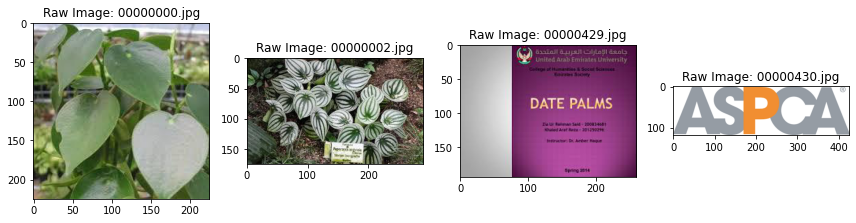

In [ ]:
plot_images(img_list[0],img_list[2],img_list[145],img_list[146])

Interesting. Later search results are less relevant to the key search terms we put in, and can result in things like drawings, graphs and fact sheets - which are all bad at training our model to do what we want it to do (classify a plant based on a natural photo.)

We'd like to do some cleaning up of these images without having to manually examine each of the files in the 500+ folders. 

## Cleaning Step 1 - Text recognition

The first filtering step we will try is to use optical character recognition (OCR) to try to find text in each of our documents. Tesseract is open-source software available for OCR that is simple to implement. We can use this to look for text, and try to crop out the text if it is along the edges, preventing data leakage or simply remove the image (removing bad training examples).

In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 35 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 3s (1,533 kB/s)
debconf: unable to initi

In [ ]:
import pytesseract
def optical_character_recognition(file, path = True):
  """ Simple OCR of text from images.

  Parameters
  ----------
  file: Path or str
    Image to examine.
  path: bool
    Indicates whether the file passed in is a path to a file, or an already opened Pillow Image.
    
  Returns:
  ----------
  str
    Text that was detected.
  """
  if path == True:
    # Use Pillow's Image class to open the image
    text = pytesseract.image_to_string(Image.open(file), config='--psm 3')
  else: 
    # Already opened with Pillow
    text = pytesseract.image_to_string(file, config='--psm 3')
  return text

### Cropping to preserve images with border text

Some images have text around the edges, which should be removed to prevent possible data leakage. 

In [ ]:
def crop_image(img_path, crop_pct = 0.1):
  """ Crops an image by a certain percent of the image size along the top and bottom of the image.

  Parameters
  ----------
  img_folder: Path or str
    Fold with images to examine.
  crop_pct: float (0<crop_pct<1)
    Percentage of the total height of the image to crop off top and bottom.
    
  Returns:
  ----------
  Cropped image (opened in PIL).
  """
  from PIL import Image
  img_file = Image.open(img_path).convert('RGB')
  [xs,ys] = img_file.size
  crop_x = crop_pct*xs
  crop_y = crop_pct*ys
  box = (0, crop_y, xs, ys-crop_y)
  cropped_image = img_file.crop(box)
  return cropped_image

def find_artificial_text(img_folder, edge_removal = True, verbose = False):
  """ Searches for artificial text in each image in a image folder using pytesseract.

  Parameters
  ----------
  img_folder: Path or str
    Fold with images to examine.
  edge_removal: bool
    Should the function attempt to crop the edges of the to remove detected text.
    If no text is found, the cropped image is saved.
  verbose: bool
    Should the function print out which images are cropped, and which images have been found to have text.  
    
  Returns:
  ----------
  DataFrame containing images marked as possessing artifical text. 
  """
  from tqdm.notebook import tqdm
  # Initialize DataFrame
  column_names = ['Artificial Images', 'Text Found']
  df_mt = pd.DataFrame(columns = column_names)
  for image_path in tqdm(sorted(img_folder.ls())):
    im = Image.open(image_path).convert('RGB')
    if edge_removal == True:
      # if the image has text
      if len(optical_character_recognition(im, path = False))>0:
        if verbose == True:print(f'Text detected in image {image_path.name}');
        # if the text is along the top or bottom edge, overwrite the old image else make note of it in a dataframe
        if len(optical_character_recognition((crop_image(image_path)).convert('RGB'), path = False)) == 0:
          if verbose == True:print(f'Cropping removed text in image {image_path.name}');
          crop_image(image_path).save(image_path)
        else:
          df_mt = df_mt.append({'Artificial Images':image_path,'Text Found':optical_character_recognition(image_path)}, ignore_index=True)
    # No cropping      
    else:
      if len(optical_character_recognition(im, path=False))>0:
        if verbose==True:print(f'Text detected in image {image_path.name}');
        df_mt = df_mt.append({'Artificial Images':image_path,'Text Found':optical_character_recognition(image_path)}, ignore_index=True)

  # Create dataframe containing images with artificial text towards the center
  if verbose == True:print(f'{len(df_mt)} images with text found in folder {img_folder}.');
  return df_mt

In [ ]:
# Lets look in a folder and grab a file
local_path = Path('/content/plant_images_database')
img_folder = local_path/'Peperomia peltifolia'
df_artificial = find_artificial_text(img_folder, edge_removal = True, verbose = True)

In [ ]:
df_artificial.iloc[0]['Text Found']

'4\n\nPeperomia Peltfotia'

In [ ]:
df_artificial.iloc[2]['Artificial Images']

Path('/content/plant_images_database/Peperomia peltifolia/00000110.jpg')

In [ ]:
def plot_images_text(dataframe, show_n = 5):
  """ Takes in the output DataFrame from find_artificial_text and shows the associated image and text.

  Parameters
  ----------
  dataframe: DataFrame
    DataFrame with Artificial Images and Text Found columns, indicating which images were found to contain what text.
  show_n: int
    How many images (and the detected text) to show.

  Returns:
  ----------
  Plots of raw images and detected text
  """
  n_images = len(df_artificial)
  height = n_images//5*2+2
  fig = plt.figure(figsize=(30,height*3))
  fig.set_facecolor("white")
  for i in range(show_n):
    a = i%5
    b = i//5
    # prepare images
    img = df_artificial.iloc[i]['Artificial Images']
    txt = df_artificial.iloc[i]['Text Found']
    # plot images
    ax = plt.subplot2grid((height,15), (b*2,a*3), colspan=2, rowspan=2)
    ax.imshow(Image.open(img))  
    ax.title.set_text(f'Image File: {repr(img.name)} \n Text Found: {repr(txt)}')

  plt.tight_layout()
  plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


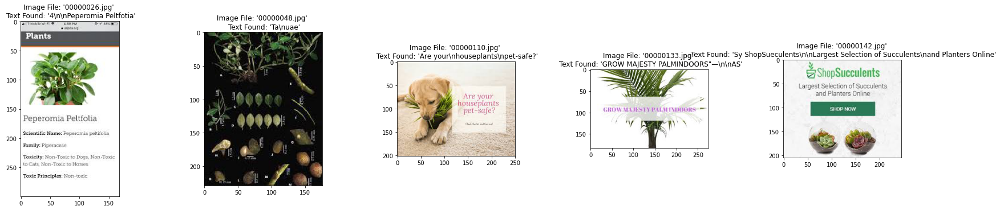

In [ ]:
# We can visualize some of these images with artificial components
plot_images_text(df_artificial, show_n=5)

# Cleaning Stage 2 - Image Histogram

In [ ]:
# Convert PIL image into a tensor
img_test = tensor(Image.open(img_folder/'00000000.jpg'))
img_test.shape

torch.Size([225, 225, 3])

The PIL image tensor has three channels - red, blue and green, stored in that order. We can isolate a single channel and have a closer look 

In [ ]:
red_channel = img_test[:,:,0][50:60,50:60]
df = pd.DataFrame(red_channel)
df.style.set_properties(**{'font-size':'6pt'}).background_gradient('Reds')

,0,1,2,3,4,5,6,7,8,9
0,131,132,132,133,133,133,133,133,133,133
1,131,132,132,133,133,133,133,133,133,133
2,131,132,132,133,133,133,133,133,133,133
3,131,132,132,133,133,133,133,133,133,133
4,131,132,132,133,133,133,133,133,133,133
5,131,132,132,133,133,133,133,133,133,133
6,133,133,133,133,133,133,137,132,128,130
7,133,133,133,133,133,133,132,131,130,132
8,133,133,133,133,133,133,129,131,133,133
9,133,133,133,133,133,133,130,132,133,131


With this kind of approach, we can identify images that have large blocks of color with very little variation, as is typically seen in text/drawing images.  

In [ ]:
def rgb_histograph(img_path, plot=True, plot_raw = True, max_intensity = 1000000, print_threshold_diagnostics = False, color_width = 1000, return_proportion = False):
  """ Takes in an image, and plots a histograph of color population against (hue,lightness) pairs. 
  If an image has a population of n (n = color_width) pixels with a specific (hue,value) pair that make up more than pct_threshold of an image, we tag that image as artificial. 

  Parameters
  ----------
  img_folder: Path or str
    Fold with images to examine.
  plot: bool
    Plot histograph or not.
  plot_raw: bool
    Plot raw images or not.
  max_intensity: int
    Ceiling value for the hue:lightness pair populations. This value will affect the pixel proportion if too low. 
  print_threshold_diagnostics: bool
    Prints diagnositic information (number of hue/lightness pairs, how many are accounted for in calculating the proportion of the final image.)
  color_width: int
    How many of the most populous hue:lightness pairs to sum together to determine the proportion of the final image.. 
  return_proportion: bool
    Should the function return the color proportion coverage value. 

  Returns:
  ----------
  Color proportion coverage value (if return_proportion=True)
    Histograph (if plot=True)
    Raw Image (if plot_raw=True)
  """
  import numpy as np
  import matplotlib.pyplot as plt
  from mpl_toolkits.mplot3d import Axes3D
  import colorsys
  from PIL import Image

  # Open image and get dimensions
  img_file = Image.open(img_path).convert('RGB')
  img = img_file.load()
  [xs,ys] = img_file.size
  max_intensity = max_intensity
  hues = {}

  # For each pixel in the image file
  for x in range(0, xs):
    for y in range(0, ys):
      # Get the RGB color of the pixel
      [r, g, b] = img[x, y]
      # Normalize pixel color values
      r /= 255.0
      g /= 255.0
      b /= 255.0
      # Convert RGB color to HSL
      [h, l, s] = colorsys.rgb_to_hls(r, g, b)
      # Count how many pixels have matching (h, l)
      if h not in hues:
        hues[h] = {}
      if l not in hues[h]:
        hues[h][l] = 1
      else:
        if hues[h][l] < max_intensity:
          hues[h][l] += 1

  # Decompose the hues object into a set of one dimensional arrays
  h_ = []
  l_ = []
  i = []
  colours = []

  for h in hues:
    for l in hues[h]:
      h_.append(h)
      l_.append(l)
      i.append(hues[h][l])
      [r, g, b] = colorsys.hls_to_rgb(h, l, 1)
      colours.append([r, g, b])

  # Plot if wanted
  raw_image = Image.open(img_path)
  raw_image = np.asarray(raw_image)
  if plot==True:
    fig = plt.figure(figsize=(12,5))
    fig.set_facecolor("white")
    ax = plt.subplot2grid((2,6), (0,0), colspan=4, rowspan=2, projection='3d')
    ax.scatter(h_, l_, i, s=30, c=colours, lw=0.5, edgecolors='black')
    ax.set_xlabel('Hue')
    ax.set_ylabel('Value')
    ax.set_zlabel('Population')
    # Plot raw image if wanted
    if plot_raw == True:
      ax2 = plt.subplot2grid((2,6), (0,4), colspan=2, rowspan=2)
      ax2.imshow(raw_image)  
      ax2.title.set_text(f'Raw Image: {img_path.name}')
    plt.tight_layout()
    plt.show()
  
  # Determine if the image we're examining is artificially generated
  n_greatest = sum(sorted(i, reverse=True)[:color_width])
  picture_size = xs*ys
  if print_threshold_diagnostics == True:
    print(f'There are {len(i)} hue/lightness pairs in this image.')
    print(f'Population of {color_width} hue/lightness pairs with the largest populations = {n_greatest}')
    print(f'This represents {n_greatest/picture_size*100:.2f}% of the total pixels in the image.')

  if return_proportion == True:
    return n_greatest/picture_size

In general, we see that artificial documents (text or drawings etc.) tend to have a higher proportion of pixels that possess exactly the same color. These plots have taken the Hue and Lightness (from conversion to HLS) of each pixel in the image and plotted the z-axis as the population of pixels that exist for given (hue and lightness) pair. 

Hence - we can see at a glance which images possess artificially high color populations. Natural photographs would typically not have this feature, due to subtle jitter in the hue and lightness from pixel to pixel that is captured and encoded into the image. This leads to hue-saturation populations that are are much flatter and well-distributed. On the other hand - computer generated images simply pick out a single hue-lightness pair when filling large areas with a color, leading to artificially high population densities for a given hue-lightness pair.

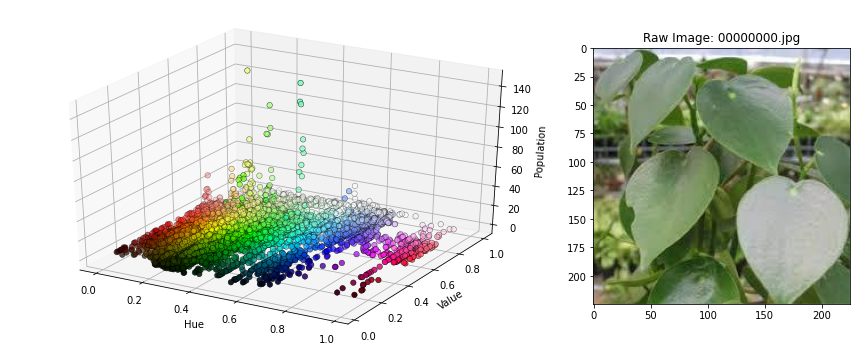

There are 27247 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 12288
This represents 24.27% of the total pixels in the image.


In [ ]:
rgb_histograph(img_list[0], print_threshold_diagnostics = True)

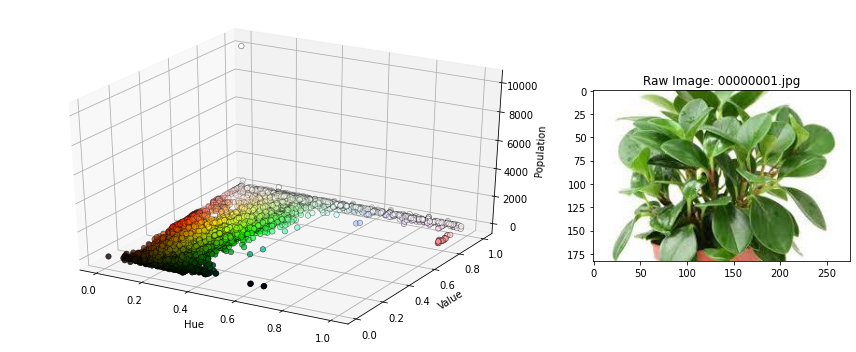

There are 26401 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 19365
This represents 38.48% of the total pixels in the image.


In [ ]:
rgb_histograph(img_list[1], print_threshold_diagnostics = True)

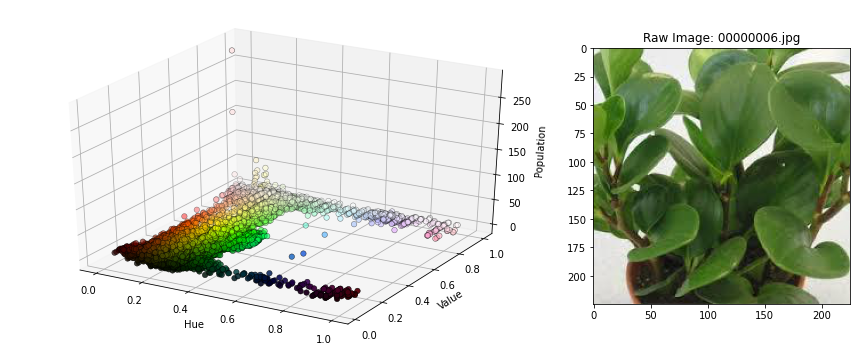

There are 24854 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 11977
This represents 23.66% of the total pixels in the image.


In [ ]:
rgb_histograph(img_list[6], print_threshold_diagnostics = True)

Even though these images appear predominantly green, there are subtle color variations in a natural photo that prevent any particular shade of color from representing too large a proportion of pixels.
This is reflected in the number of hue/lightness pairings.

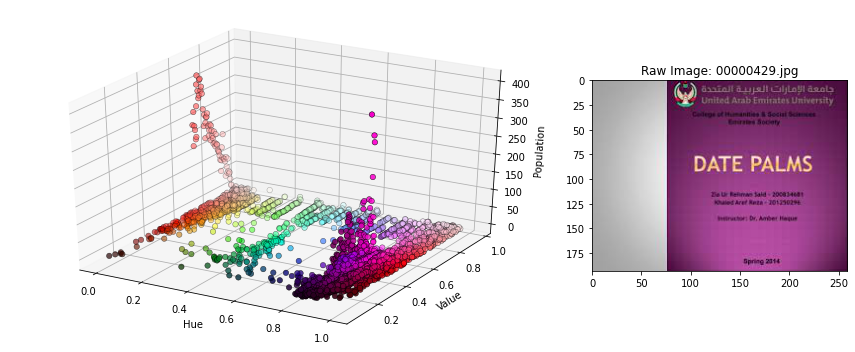

There are 10149 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 36406
This represents 72.46% of the total pixels in the image.


In [ ]:
rgb_histograph(img_list[145], print_threshold_diagnostics = True)

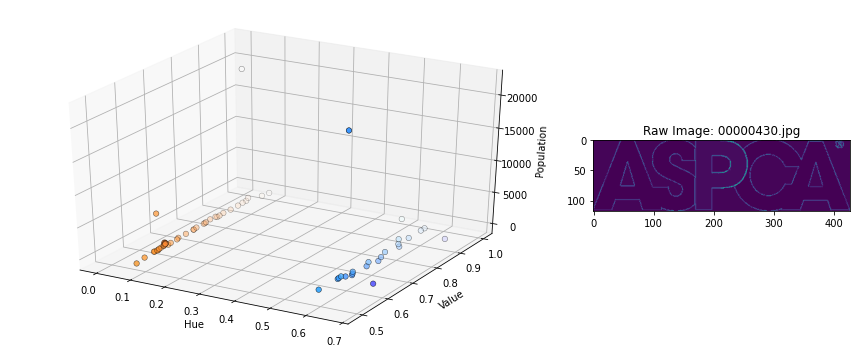

There are 66 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 50268
This represents 100.00% of the total pixels in the image.


In [ ]:
rgb_histograph(img_list[146], print_threshold_diagnostics = True)

We can see that images that possess a hue/lightness pairing that are evenly spread tend to be natural images, whereas those with artifical components (text documents etc.) have large swathes of color that would be impossibly similar to be by accident. 

Additionally, natural images have on the order of 20 to 30 thousand hue/lightness pairings, compared to artificial images that may contain as few as 100. 

After processing a few folders, we're going to say that if 1000 hue:lightness pairs represent over 70% of the pixels in the image, that image is not a good training example and should be removed. 

In [ ]:
def find_artificial_colors(img_folder, return_all=False, threshold=0.7):
  """ Finds images in an img_folder with excessively shallow color profiles that will be poor examples of a class. 

  Parameters
  ----------
  img_folder: Path or str
    Fold with images to examine.
  return_all: bool
    Determines if the function should return the entire dataset.
  threshold: float, 0 < threshold < 1 
    What percent of the image is acceptable for 1000 hue:lightness pairs to occupy, more than this is tagged for removal.

  Returns:
  ----------
  DataFrame
    DataFrame with image paths to remove, and reason (pixel proportion).
  """
  from tqdm.notebook import tqdm
  # Initialize DataFrame
  column_names = ['Artificial Images', 'Pixel Proportion']
  df_mt = pd.DataFrame(columns = column_names)
  # Loop over folder
  for image in tqdm(img_folder.ls()):
    proportion = rgb_histograph(image, plot = False, plot_raw = False, return_proportion=True)
    # Append to dataframe
    df_mt = df_mt.append({'Artificial Images':image,'Pixel Proportion':proportion}, ignore_index=True)

  if return_all == True:
    return df_mt
  else:
    df_mt = df_mt[df_mt['Pixel Proportion']>threshold]
    print (f'{len(df_mt)} artificial images found')
    return df_mt

In [ ]:
df_artificial = find_artificial_colors(img_folder, threshold=0.7)


6 artificial images found


In [ ]:
df_artificial

,Artificial Images,Pixel Proportion
4,/content/plant_images_database/Silene acaulis/00000384.jpg,1.000000
21,/content/plant_images_database/Silene acaulis/00000022.jpg,1.000000
38,/content/plant_images_database/Silene acaulis/00000130.jpg,0.926604
43,/content/plant_images_database/Silene acaulis/00000103.jpg,1.000000
73,/content/plant_images_database/Silene acaulis/00000101.jpg,0.734189
113,/content/plant_images_database/Silene acaulis/00000389.jpg,0.719102


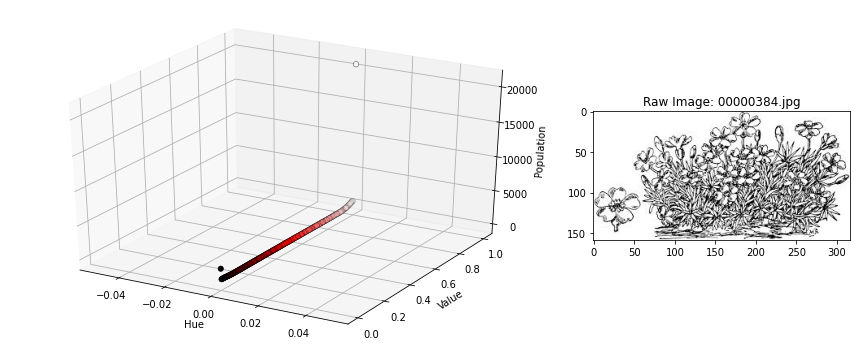

There are 256 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 50244
This represents 100.00% of the total pixels in the image.


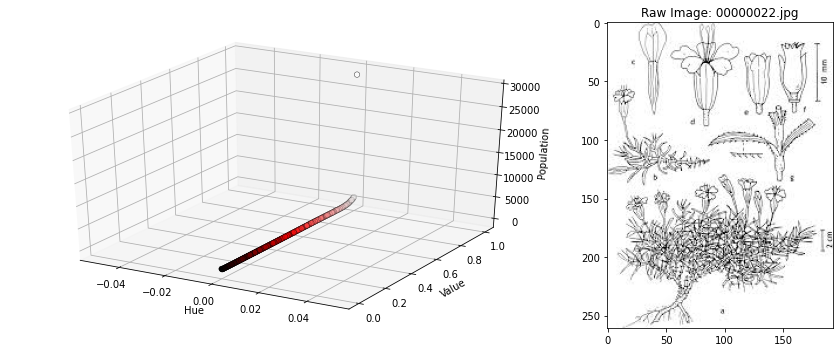

There are 256 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 50373
This represents 100.00% of the total pixels in the image.


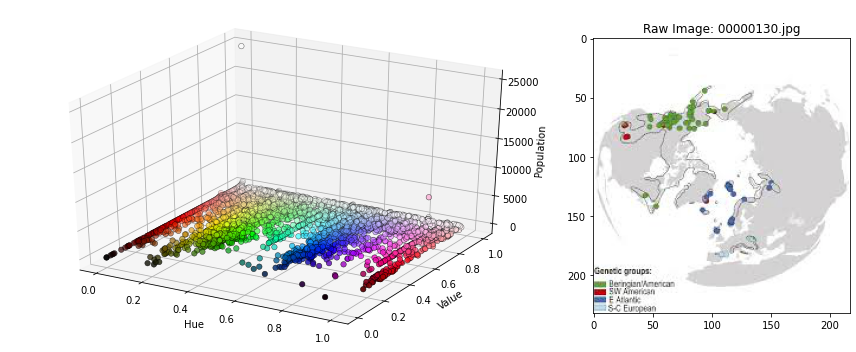

There are 4711 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 46850
This represents 92.66% of the total pixels in the image.


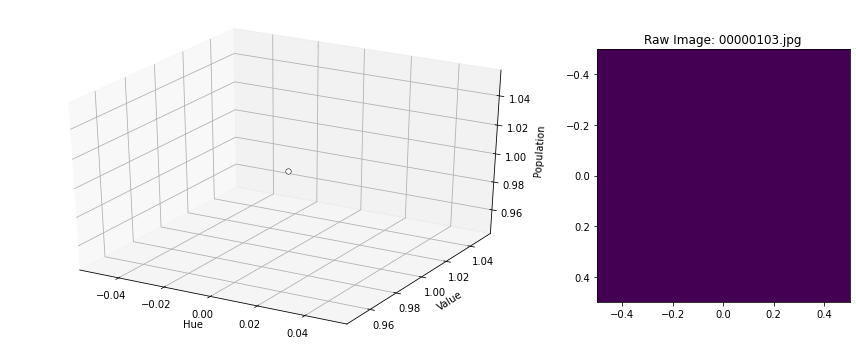

There are 1 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 1
This represents 100.00% of the total pixels in the image.


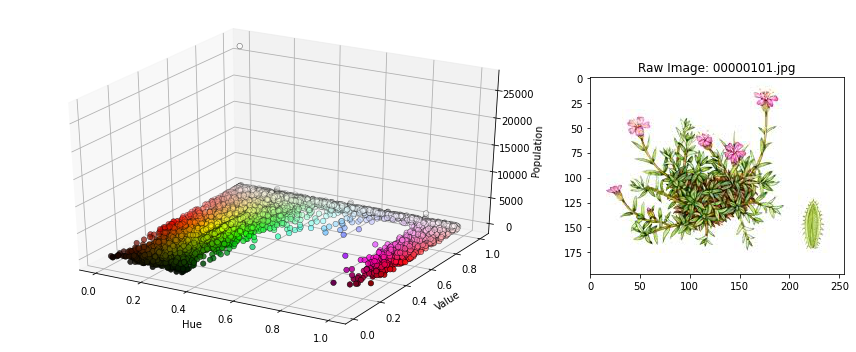

There are 13990 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 36882
This represents 73.42% of the total pixels in the image.


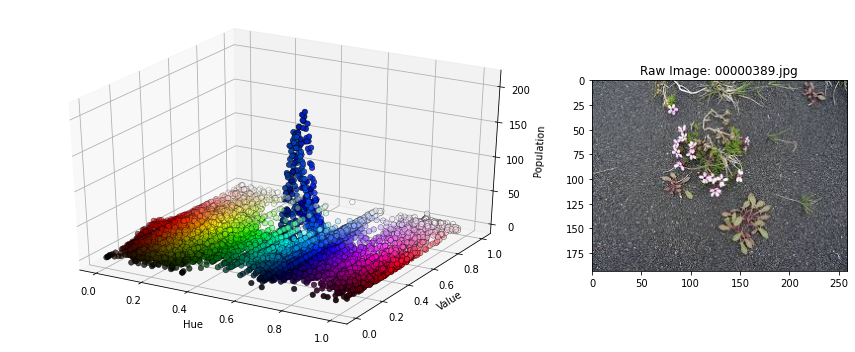

There are 12017 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 36132
This represents 71.91% of the total pixels in the image.


In [ ]:
# We can visualize these images deemed to be clearly artificial
for i in range(len(df_artificial)):
  rgb_histograph(df_artificial.iloc[i,0], print_threshold_diagnostics = True, color_width = 1000, max_intensity=1000000)

## Putting text detection and colour histogram to detect artificial images

If we put these techniques together, we can remove the false text positives from the previous filtering - these images may appear to have text due to the arrangement of leaves or branches. If such images have a very even spread of colors (1000 H:L pairs representing less than 50% of the pixels), we will consider it to be a false positive.  

In [ ]:
def find_artificial_images(img_folder, edge_removal = True, threshold = 0.7, text_threshold = 0.5):
  """ Examines each image in an img_folder for artificial images that will be poor examples of a class. 

  Parameters
  ----------
  img_folder: Path or str
    Fold with images to examine.
  edge_removal: bool
    Determines if the function should attempt to remove text by cropping 10% of the image at the top and bottom.
  threshold: float, 0 < threshold < 1 
    What percent of the image is acceptable for 1000 hue:lightness pairs to occupy, more than this is tagged for removal.
  text_threshold: float, 0 < text_threshold < 1 
    When text is detected, what threshold is also needed for removal.

  Returns:
  ----------
  DataFrame
    DataFrame with image paths to remove, and reason (text, pixel proportion).
  """
  df_colors = find_artificial_colors(img_folder, threshold=threshold, return_all = True)
  df_text = find_artificial_text(img_folder, edge_removal=edge_removal)
  # Inner merge to get color data
  df_text_colors = df_text.merge(df_colors, how='inner', on='Artificial Images')
  # Remove if text is supposedly present and 1000 hue:lightness pairs account for more than 50% of the image
    # Try to keep false positives
  df_text_remove = df_text_colors[df_text_colors['Pixel Proportion']>text_threshold]
  # Remove if 1000 hue:lightness pairs account for more than 70% of the image
  df_colors_remove = df_colors[df_colors['Pixel Proportion']>threshold]
  # Put together dataframe of images to remove
  df_remove = df_text_remove.merge(df_colors_remove, how='outer', on = ['Artificial Images', 'Pixel Proportion'])
  return df_remove

In [ ]:
find_artificial_text(img_folder, edge_removal=True)

In [ ]:
img_folder = Path('/content/plant_images_database/Silene acaulis')
df_remove = find_artificial_images(img_folder)

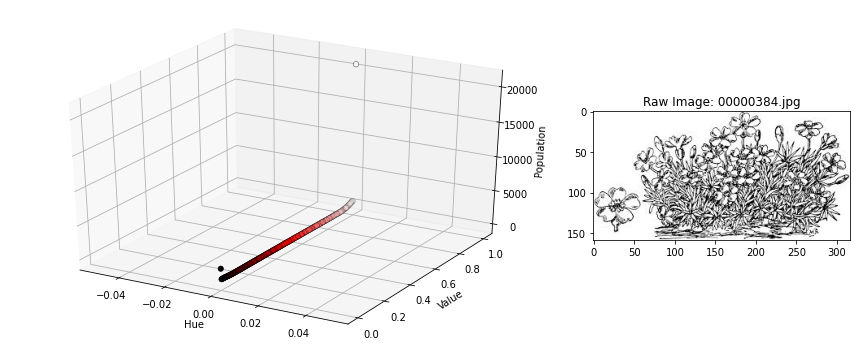

There are 256 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 50244
This represents 100.00% of the total pixels in the image.


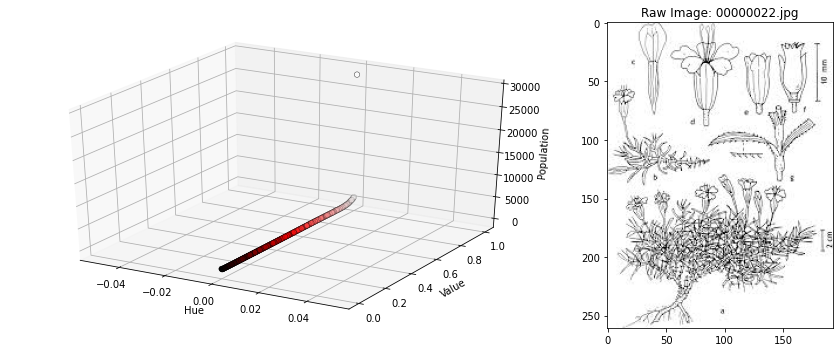

There are 256 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 50373
This represents 100.00% of the total pixels in the image.


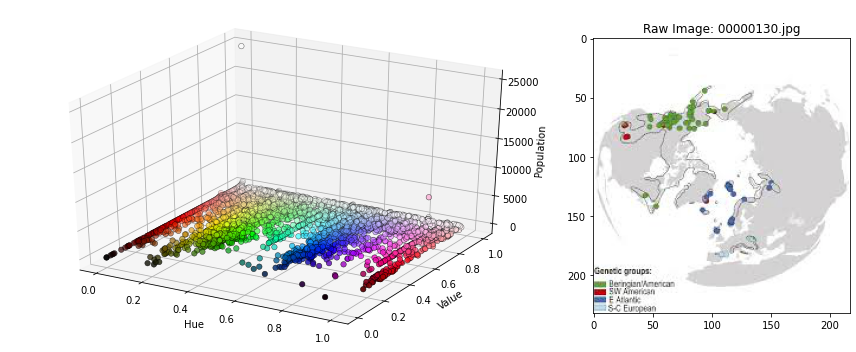

There are 4711 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 46850
This represents 92.66% of the total pixels in the image.


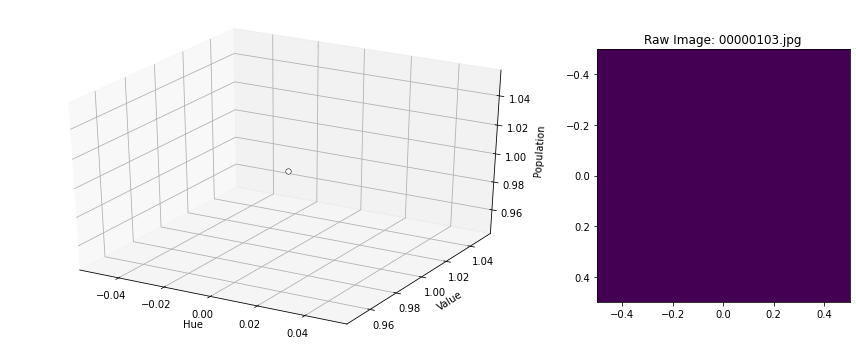

There are 1 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 1
This represents 100.00% of the total pixels in the image.


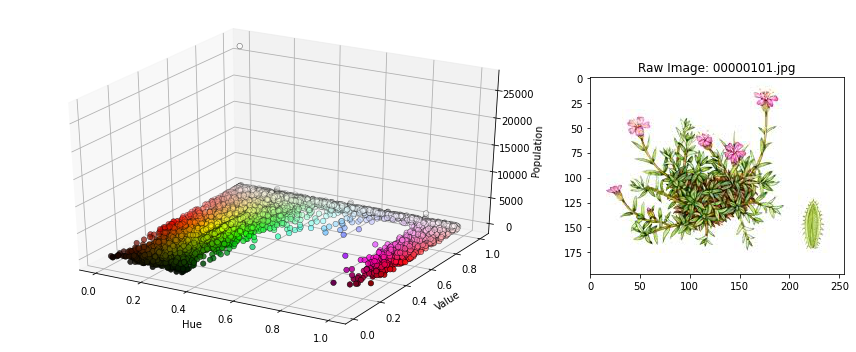

There are 13990 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 36882
This represents 73.42% of the total pixels in the image.


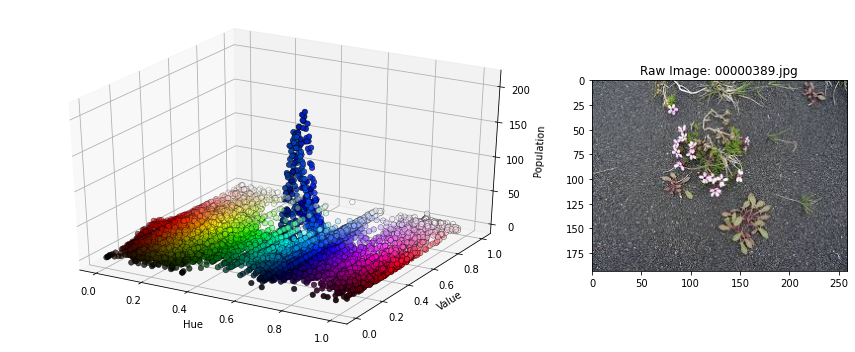

There are 12017 hue/lightness pairs in this image.
Population of 1000 hue/lightness pairs with the largest populations = 36132
This represents 71.91% of the total pixels in the image.


In [ ]:
# We can visualize these images that we are confident are poor for training purposes. 
for i in range(len(df_remove)):
  rgb_histograph(df_remove['Artificial Images'][i], print_threshold_diagnostics = True)

Now we can scan a folder for images with text, or an excessively shallow color profile, and mark them for deletion. 

Let's clean up our database!

## Delete the unwanted cross-section

In [ ]:
path = Path('/content/drive/My Drive/Houseplant Classifier/plant_images_deepest')
folder_list = sorted(np.asarray(path.ls()))

In [ ]:
from tqdm.notebook import tqdm
for img_folder in tqdm(folder_list[195:]):
  print(f'Examining {img_folder}')
  if len(img_folder.ls()) == 150:
    df_remove = find_artificial_images(img_folder, edge_removal = True)
    print(f'Removing {len(df_remove)} images from {img_folder}.')
    for i in range(len(df_remove)):
      # Path.unlink will delete these images from their directories. 
      df_remove['Artificial Images'][i].unlink()
  else:
    print(f'{img_folder} already done.')

Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Dysphania botrys
/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Dysphania botrys already done.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echeveria
/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echeveria already done.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echeveria derenbergii
/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echeveria derenbergii already done.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echeveria elegans
/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echeveria elegans already done.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echeveria gilva
/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echeveria gilva already done.
Examining /content/drive/My Drive/Houseplant


Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echeveria secunda.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echinops
/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echinops already done.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echinopsis eyriesii
/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Echinopsis eyriesii already done.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Eichhornia crassipes
/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Eichhornia crassipes already done.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Elaeagnus
/content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Elaeagnus already done.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Encyclia tampensis
/content/drive/My Drive/Houseplant Classif


Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Epidendrum ibaguense.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Epilobium angustifolium



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Epilobium angustifolium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Epipremnum aureum



Removing 34 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Epipremnum aureum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Episcia



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Episcia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Episcia dianthiflora



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Episcia dianthiflora.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Episcia reptans



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Episcia reptans.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Erigeron speciosus



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Erigeron speciosus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Eriogonum inflatum



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Eriogonum inflatum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Eriogonum umbellatum



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Eriogonum umbellatum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Eucalyptus



Removing 51 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Eucalyptus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Euonymus atropurpureus



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Euonymus atropurpureus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Euonymus occidentalis



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Euonymus occidentalis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Euphorbia pulcherrima



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Euphorbia pulcherrima.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Euphorbia tirucalli



Removing 18 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Euphorbia tirucalli.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Exacum affine



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Exacum affine.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fagopyrum



Removing 19 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fagopyrum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fatsia japonica



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fatsia japonica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Felicia amelloides



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Felicia amelloides.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ficus



Removing 43 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ficus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ficus benjamina



Removing 25 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ficus benjamina.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fittonia albivenis



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fittonia albivenis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Foeniculum vulgare



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Foeniculum vulgare.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fragaria



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fragaria.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Frithia pulchra



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Frithia pulchra.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fuchsia



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fuchsia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fuchsia triphylla



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Fuchsia triphylla.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Galtonia



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Galtonia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gardenia jasminoides



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gardenia jasminoides.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gerbera jamesonii



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gerbera jamesonii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gladiolus



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gladiolus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gleditsia triacanthos



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gleditsia triacanthos.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gloriosa superba



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gloriosa superba.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gloxinella lindeniana



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gloxinella lindeniana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gloxinia perennis



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gloxinia perennis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Guzmania lingulata var. concolor



Removing 20 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Guzmania lingulata var. concolor.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Guzmania musaica



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Guzmania musaica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gymnema



Removing 51 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gymnema.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gynura aurantiaca



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gynura aurantiaca.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gypsophila elegans



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Gypsophila elegans.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Halesia carolina



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Halesia carolina.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Haworthia



Removing 18 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Haworthia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Haworthia fasciata



Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Haworthia fasciata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Haworthia pumila



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Haworthia pumila.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Haworthia retusa



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Haworthia retusa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hedera helix



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hedera helix.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hedychium coronarium



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hedychium coronarium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hedychium gardnerianum



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hedychium gardnerianum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Helianthus angustifolius



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Helianthus angustifolius.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Helleborus niger



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Helleborus niger.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hemerocallis



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hemerocallis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hemerocallis minor



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hemerocallis minor.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hemigraphis alternata



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hemigraphis alternata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Heracleum maximum



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Heracleum maximum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Heuchera sanguinea



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Heuchera sanguinea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hibiscus syriacus



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hibiscus syriacus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hippeastrum



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hippeastrum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hosta plantaginea



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hosta plantaginea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Howea belmoreana



Removing 15 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Howea belmoreana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Howea forsteriana



Removing 42 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Howea forsteriana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hoya carnosa



Removing 17 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hoya carnosa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hoya kerrii



Removing 32 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hoya kerrii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hoya pubicalyx



Removing 22 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hoya pubicalyx.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Humulus lupulus



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Humulus lupulus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hyacinthus orientalis



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hyacinthus orientalis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hydrangea arborescens



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hydrangea arborescens.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hylocereus undatus



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hylocereus undatus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hypericum perforatum



Removing 25 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hypericum perforatum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hypoestes phyllostachya



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Hypoestes phyllostachya.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ilex aquifolium



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ilex aquifolium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ilex opaca



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ilex opaca.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Impatiens



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Impatiens.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Incarvillea delavayi



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Incarvillea delavayi.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ipomoea



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ipomoea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ipomoea batatas



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ipomoea batatas.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Iresine herbstii



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Iresine herbstii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Iris



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Iris.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Iris domestica



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Iris domestica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Iris spuria



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Iris spuria.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ixora coccinea



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ixora coccinea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ixora javanica



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ixora javanica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Jacaranda copaia



Removing 33 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Jacaranda copaia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Jasminum



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Jasminum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Juglans nigra



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Juglans nigra.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kaempferia



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kaempferia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalanchoe



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalanchoe.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalanchoe tubiflora



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalanchoe tubiflora.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalmia angustifolia



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalmia angustifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalmia latifolia



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalmia latifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalmia polifolia



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kalmia polifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kniphofia



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Kniphofia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lagerstroemia indica



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lagerstroemia indica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lampranthus piquetbergensis



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lampranthus piquetbergensis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lantana camara



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lantana camara.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Larrea tridentata



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Larrea tridentata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lathyrus latifolius



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lathyrus latifolius.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Laurus nobilis



Removing 19 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Laurus nobilis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lavandula angustifolia



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lavandula angustifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Leucocrinum montanum



Removing 18 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Leucocrinum montanum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Leucospermum vestitum



Removing 24 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Leucospermum vestitum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Leucothoe



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Leucothoe.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Levisticum officinale



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Levisticum officinale.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ligustrum japonicum



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ligustrum japonicum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ligustrum vulgare



Removing 15 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ligustrum vulgare.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium japonicum



Removing 19 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium japonicum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium lancifolium



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium lancifolium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium longiflorum



Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium longiflorum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium philadelphicum



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium philadelphicum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium speciosum



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lilium speciosum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Liriodendron tulipifera



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Liriodendron tulipifera.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Liriope muscari



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Liriope muscari.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lithops naureeniae



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lithops naureeniae.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lobelia cardinalis



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lobelia cardinalis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lophospermum erubescens



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lophospermum erubescens.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ludisia discolor



Removing 31 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ludisia discolor.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lyonia



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Lyonia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Macadamia integrifolia



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Macadamia integrifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Magnolia stellata



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Magnolia stellata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Malus sylvestris



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Malus sylvestris.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Mammillaria gracilis



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Mammillaria gracilis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Marsdenia floribunda



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Marsdenia floribunda.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Masdevallia



Removing 39 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Masdevallia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Melia azedarach



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Melia azedarach.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Melissa officinalis



Removing 18 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Melissa officinalis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Mentha



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Mentha.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Miltoniopsis roezlii



Removing 25 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Miltoniopsis roezlii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Misopates orontium



Removing 20 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Misopates orontium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Monstera deliciosa



Removing 33 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Monstera deliciosa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Morus



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Morus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Musa acuminata



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Musa acuminata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Muscari armeniacum



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Muscari armeniacum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nandina domestica



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nandina domestica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Narcissus



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Narcissus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Narcissus jonquilla



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Narcissus jonquilla.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nasturtium officinale



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nasturtium officinale.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Neomortonia nummularia



Removing 36 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Neomortonia nummularia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Neoregelia



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Neoregelia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Neoregelia spectabilis



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Neoregelia spectabilis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nepeta cataria



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nepeta cataria.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nephrolepis biserrata



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nephrolepis biserrata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nephrolepis cordifolia



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nephrolepis cordifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nephrolepis exaltata



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nephrolepis exaltata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nerium oleander



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nerium oleander.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nicotiana glauca



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Nicotiana glauca.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ocimum basilicum



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ocimum basilicum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oleaceae



Removing 28 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oleaceae.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oncidium alexandrae



Removing 34 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oncidium alexandrae.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oncidium sphacelatum



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oncidium sphacelatum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Onychium japonicum



Removing 21 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Onychium japonicum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Opuntia



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Opuntia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Orbea variegata



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Orbea variegata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Origanum majorana



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Origanum majorana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Origanum vulgare subsp. hirtum



Removing 17 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Origanum vulgare subsp. hirtum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oxalis



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oxalis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oxytropis



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Oxytropis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Paeonia officinalis



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Paeonia officinalis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pelargonium



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pelargonium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pellaea rotundifolia



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pellaea rotundifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pellionia repens



Removing 15 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pellionia repens.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia argyreia



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia argyreia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia caperata



Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia caperata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia clusiifolia



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia clusiifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia crassifolia



Removing 48 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia crassifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia griseoargentia



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia griseoargentia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia obtusifolia



Removing 22 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia obtusifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia peltifolia



Removing 35 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia peltifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia prostrata



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia prostrata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia rotundifolia



Removing 23 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia rotundifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia serpens



Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Peperomia serpens.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Petroselinum crispum



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Petroselinum crispum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Petunia



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Petunia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phalaenopsis



Removing 62 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phalaenopsis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron



Removing 28 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron bipennifolium



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron bipennifolium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron bipinnatifidum



Removing 19 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron bipinnatifidum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron hederaceum



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron hederaceum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron hederaceum var. oxycardium



Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Philodendron hederaceum var. oxycardium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phlox subulata



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phlox subulata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phoenix acaulis



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phoenix acaulis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phoenix canariensis



Removing 21 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phoenix canariensis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phoenix roebelenii



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phoenix roebelenii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phoradendron leucarpum



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phoradendron leucarpum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phyllostachys aurea



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Phyllostachys aurea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pieris japonica



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pieris japonica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea cadierei



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea cadierei.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea involucrata



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea involucrata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea microphylla



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea microphylla.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea nummulariifolia



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea nummulariifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea pumila



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pilea pumila.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pinus ponderosa



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pinus ponderosa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pittosporum tobira



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pittosporum tobira.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Platanus occidentalis



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Platanus occidentalis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Platycerium alcicorne



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Platycerium alcicorne.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Platycerium bifurcatum



Removing 21 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Platycerium bifurcatum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Plectranthus amboinicus



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Plectranthus amboinicus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Plectranthus glabratus



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Plectranthus glabratus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Plectranthus oertendahlii



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Plectranthus oertendahlii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Plectranthus parviflorus



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Plectranthus parviflorus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pleiospilos bolusii



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pleiospilos bolusii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Podocarpus macrophyllus



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Podocarpus macrophyllus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Podophyllum peltatum



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Podophyllum peltatum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Polyscias guilfoylei



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Polyscias guilfoylei.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Polystichum acrostichoides



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Polystichum acrostichoides.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Polystichum munitum



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Polystichum munitum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Portulaca oleracea



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Portulaca oleracea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Potentilla



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Potentilla.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Primula vulgaris



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Primula vulgaris.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prosopis pallida



Removing 27 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prosopis pallida.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prosthechea prismatocarpa



Removing 31 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prosthechea prismatocarpa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus armeniaca



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus armeniaca.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus avium



Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus avium.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus domestica



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus domestica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus persica



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus persica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus serotina



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus serotina.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus virginiana



Removing 2 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Prunus virginiana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Psychilis atropurpurea



Removing 38 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Psychilis atropurpurea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pteris



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Pteris.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rajania hastata



Removing 104 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rajania hastata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ranunculus



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ranunculus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ranunculus acris



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ranunculus acris.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ravenea rivularis



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ravenea rivularis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rhapis excelsa



Removing 22 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rhapis excelsa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rhaponticum repens



Removing 18 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rhaponticum repens.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rheum rhabarbarum



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rheum rhabarbarum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rhipsalis dichotoma



Removing 35 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rhipsalis dichotoma.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rhododendron



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rhododendron.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ricinus communis



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Ricinus communis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Robinia



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Robinia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rosa



Removing 45 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rosa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rosmarinus officinalis



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rosmarinus officinalis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rubus pedatus



Removing 23 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rubus pedatus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rumex



Removing 15 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rumex.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rumex scutatus



Removing 17 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Rumex scutatus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Saintpaulia



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Saintpaulia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Saintpaulia confusa



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Saintpaulia confusa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Salix purpurea



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Salix purpurea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Salvia coccinea



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Salvia coccinea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Salvia officinalis



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Salvia officinalis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sanguisorba minor



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sanguisorba minor.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sansevieria trifasciata



Removing 48 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sansevieria trifasciata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sanvitalia



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sanvitalia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Satureja hortensis



Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Satureja hortensis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schefflera



Removing 23 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schefflera.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schefflera actinophylla



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schefflera actinophylla.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schefflera elegantissima



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schefflera elegantissima.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schlumbergera bridgesii



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schlumbergera bridgesii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schlumbergera russelliana



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Schlumbergera russelliana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Scindapsus pictus



Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Scindapsus pictus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sedum album



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sedum album.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sedum morganianum



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sedum morganianum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sedum weinbergii



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sedum weinbergii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Selaginella kraussiana



Removing 8 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Selaginella kraussiana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Senecio



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Senecio.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Silene acaulis



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Silene acaulis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sinningia speciosa



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sinningia speciosa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax glabra



Removing 55 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax glabra.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax glauca



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax glauca.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax herbacea



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax herbacea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax laurifolia



Removing 16 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax laurifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax rotundifolia



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax rotundifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax tamnoides



Removing 17 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax tamnoides.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax walteri



Removing 19 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Smilax walteri.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum dulcamara



Removing 18 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum dulcamara.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum lycopersicum



Removing 18 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum lycopersicum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum nigrum



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum nigrum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum pseudocapsicum



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Solanum pseudocapsicum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Soleirolia soleirolii



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Soleirolia soleirolii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sophronitis



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sophronitis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sorghum bicolor



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sorghum bicolor.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Spathiphyllum



Removing 35 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Spathiphyllum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sphenosciadium capitellatum



Removing 19 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Sphenosciadium capitellatum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Stapelia hirsuta



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Stapelia hirsuta.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Stevia rebaudiana



Removing 27 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Stevia rebaudiana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Stewartia ovata



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Stewartia ovata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Strelitzia reginae



Removing 32 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Strelitzia reginae.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Streptocarpus



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Streptocarpus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Symplocarpus foetidus



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Symplocarpus foetidus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Syngonium podophyllum



Removing 24 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Syngonium podophyllum.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Taxus



Removing 11 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Taxus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Taxus baccata



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Taxus baccata.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Taxus brevifolia



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Taxus brevifolia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Taxus canadensis



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Taxus canadensis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Thymus vulgaris



Removing 13 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Thymus vulgaris.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tilia americana



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tilia americana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tolmiea menziesii



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tolmiea menziesii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Townsendia exscapa



Removing 22 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Townsendia exscapa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Toxicodendron



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Toxicodendron.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Trachelospermum jasminoides



Removing 0 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Trachelospermum jasminoides.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Trachycarpus fortunei



Removing 7 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Trachycarpus fortunei.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tradescantia fluminensis



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tradescantia fluminensis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tradescantia zebrina



Removing 14 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tradescantia zebrina.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tripogandra multiflora



Removing 26 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tripogandra multiflora.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tropaeolum majus



Removing 5 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tropaeolum majus.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tsuga



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tsuga.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tsuga canadensis



Removing 3 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tsuga canadensis.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tsuga caroliniana



Removing 26 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tsuga caroliniana.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tulipa



Removing 10 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Tulipa.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Viburnum lentago



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Viburnum lentago.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Wisteria



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Wisteria.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Yucca



Removing 22 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Yucca.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zamia



Removing 18 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zamia.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zamia furfuracea



Removing 6 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zamia furfuracea.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zamia pumila



Removing 4 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zamia pumila.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zantedeschia aethiopica



Removing 9 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zantedeschia aethiopica.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zephyranthes drummondii



Removing 12 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zephyranthes drummondii.
Examining /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zinnia



Removing 1 images from /content/drive/My Drive/Houseplant Classifier/plant_images_deepest/Zinnia.



# Set Up Model

In [ ]:
_# Run once per session
!pip install fastscript -q
!pip install fastai==2.0.14 -q
from fastai.basics import *
from fastai.vision.all import *
from fastai.callback.all import *
from fastai.distributed import *
from fastprogress import fastprogress
from torchvision.models import *
from fastai.vision.models.xresnet import *
from fastscript import *

fastprogress.MAX_COLS = 80

# memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

In [ ]:
def create_path_df(path:str, pct_images=1, shuffle = False):
  '''
  Takes a path of a folder containing images within their subfolders. 
  Can return a subset of those images based on the pct_images.
    Returns the first (most relevant) subsection.
  '''
  from sklearn.utils import shuffle
  data = []
  for folder in sorted(os.listdir(path)):
      num_files = len(sorted(os.listdir(path+'/'+folder)))
      cut_point = int(num_files*pct_images)
      # Takes the first pct_images from each folder
      for file in sorted(os.listdir(path+'/'+folder))[:cut_point]:
          data.append((folder, path+folder+'/'+file))
  df = pd.DataFrame(data, columns=['Class', 'Path'])
  print(f'Creating path:label dataframe from {path}, using {pct_images*100}% of the images ({len(df)} images.)')
  return df

def stratified_split(dataframe, n_splits = 5, shuffle = True, random_state = 101, fold = 0):
  from sklearn.model_selection import StratifiedKFold
  # Create stratified split using sklearn
  print(f'Using dataframe to prepare stratified {n_splits} fold split, random state is {random_state}. Returning fold {fold}.')
  kf = StratifiedKFold(n_splits=n_splits, shuffle=shuffle, random_state = random_state)
  X, y = dataframe['Path'], dataframe['Class']
  splits = list(kf.split(X, y))
  # Prepare the selected fold
  fold = fold
  train_df = dataframe.loc[splits[fold][0]]
  val_df = dataframe.loc[splits[fold][1]]
  train_df['is_valid'] = False
  val_df['is_valid'] = True
  df_cnn = train_df.append(val_df)
  # Return the selected fold
  return df_cnn
  
def random_seed(seed_value, use_cuda):
    np.random.seed(seed_value) # cpu vars
    torch.manual_seed(seed_value) # cpu  vars
    random.seed(seed_value) # Python
    if use_cuda: 
        torch.cuda.manual_seed(seed_value)
        torch.cuda.manual_seed_all(seed_value) # gpu vars
        torch.backends.cudnn.deterministic = True  #needed
        torch.backends.cudnn.benchmark = False
    print(f'Random state set:{seed_value}, cuda used: {use_cuda}')
  
def enumerate_params():
  total_params = sum(p.numel() for p in learn.model.parameters())
  print(f'{total_params:,} total parameters.')
  total_trainable_params = sum(
  p.numel() for p in learn.model.parameters() if p.requires_grad)
  print(f'{total_trainable_params:,} training parameters.')

In [ ]:
def get_dbunch(img_path:str='/content/plant_images_database_manualcleanedlosses10/', 
               split_path = '/content/plant_image_database/', 
               split_df = None, 
               img_size:int=224, 
               class_column='Class', 
               path_column='Path', 
               pct_images=1, 
               bs=64, 
               deterministic = False):
  '''
  Dataframe that defines image path and classes must have a columns for class_column and path_column as well as a 'is_valid' column. 
  Can prepare a smaller version of the dataframe, using first % of images. 
    Merges the train/validation split back onto a master dataframe to maintain same split. 
  '''
  # Get file path and labels from the dataframe we set up
  get_x = lambda x: x[f'{path_column}']
  get_y = lambda y: y[f'{class_column}']
  # Define custom split based on previous stratification
  def stratifiedsplitter(df):      
      train = df.index[~df['is_valid']].tolist()
      valid = df.index[df['is_valid']].tolist()
      return train,valid   
  # Prepare transforms
  item_tfms=[RandomResizedCrop(512, min_scale = 0.7)]
  batch_tfms=[*aug_transforms(size=img_size), Normalize.from_stats(*imagenet_stats)]
  # Prepare DataBlock
  data = DataBlock(blocks=(ImageBlock, CategoryBlock),
                    splitter=stratifiedsplitter,            # Stratified train/validation split
                    get_x=get_x,                            # Get the image path from dataframe
                    get_y=get_y,                            # Label from dataframe
                    item_tfms=item_tfms,                    # Crop images to a square
                    batch_tfms=batch_tfms)                  # Normalize the images based on the imagenet stats
  # Create split_df
  if split_df == None:
    df = create_path_df(split_path, pct_images=1)
    split_df = stratified_split(df, n_splits = 5, shuffle = True, random_state = 101, fold = 0)
    split_df['Path']= split_df['Path'].apply(lambda x:img_path+'/'.join(x.split('/')[-2:]))
  # Create a dataframe with a (possibly) reduced number of images
  df_mini = create_path_df(img_path, pct_images=pct_images)
  # Inner join this reduced dataframe to the previous splits to maintain the same training images
  df_cnn_mini= df_mini.merge(split_df, how = 'inner', on = [class_column,path_column])
  dls = data.dataloaders(df_cnn_mini, bs=bs)
  # print some information
  print(f'We have {dls.c} classes, with a training set of size {len(dls.train_ds)}, and a validation set of size {len(dls.valid_ds)}')
  if pct_images<1 or img_path!=split_path:
    print(f"The main split has {split_df['is_valid'].describe()['freq']/len(split_df['is_valid'])*100:.2f}% training data with {len(split_df.groupby('Class').count())} classes, the reduced split has {df_cnn_mini['is_valid'].describe()['freq']/len(df_cnn_mini['is_valid'])*100:.2f} % training data, with {len(df_cnn_mini.groupby('Class').count())} classes.")
  return data.dataloaders(df_cnn_mini, bs=bs)


We have to think a little bit carefully about ensuring that the splitting process is reproducible so we can compare our results after cleaning the dataset. A random split, even with a fixed seed will behave differently when we remove some samples. 

To do this, we will use an sklearn stratification process to create a dataframe containing the labels for the train/validation split. 

In some situations you may want to [remove randomness](https://forums.fast.ai/t/solved-reproducibility-where-is-the-randomness-coming-in/31628/16) for your tests. 
To get identical reproducable results set, you’ll need to set num_workers=1 (or 0) in your DataLoader/DataBunch, and depending on whether you are using torch’s random functions, or python’s (numpy), you will have to set seeds for each of those. 

However, typically this may not be a good idea as getting high variation between different runs might be a good insight that there is something wrong.
natural variation can help you to achieve even better score if you use cv

In [ ]:
# Import source of efficientnet models and weights
!pip install geffnet -q
from geffnet import *

@call_parse
def create_cnn_learner(
        size:  Param("Size", int)=224,
        bs:    Param("Batch size", int)=64,
        opt:   Param("Optimizer (adam,rms,sgd,ranger)", str)='adam',
        arch:  Param("Architecture", str)='resnet34',
        fp16:  Param("Use mixed precision training", int)=0,
        deterministic: Param("Deterministic learner", bool)=True,
        pretrained: Param("Pretrained architecture", bool)=True,
        pct_images: Param("Percent of images to sue", float)=1,
        img_path: Param("Path of images to use", str)='/content/plant_images_database_manualcleanedlosses10/',
        model_dir: Param("Path to save model", str)='/content/drive/My Drive/Houseplant Classifier/Models/',
        log_name: Param("Name of csv training log", str)='history.csv',
        splitter: Param("Custom splitter", str)=None,
        sa: Param("Self Attention for XResNet", bool)=False,
        act_cls: Param("Activation class to use", str)='ReLU',
        loss_func: Param("Learner loss function", str)=None,
        mixup: Param("Mixup", str)=None,
        cutmix: Param("Cutmix", str)=None,
        randomerasing: Param("Random Erasing", str)=None,
        ):
    # Select optimization function
    if   opt=='adam'  : opt_func = partial(Adam, mom=0.9, sqr_mom=0.99, eps=1e-05, wd=0.01, decouple_wd=True)
    elif opt=='rms'   : opt_func = partial(RMSprop, sqr_mom=0.99, mom=0.0, wd=0.0, decouple_wd=True)
    elif opt=='sgd'   : opt_func = partial(SGD, mom=0.0, wd=0.0, decouple_wd=True)
    elif opt=='ranger': opt_func = partial(ranger, mom=0.95, wd=0.01, eps=1e-06, sqr_mom=0.99, beta=0.0, decouple_wd=True)
    # Get DataLoader
    if deterministic == True:
      random_seed(101,True)
    # Implement RandomErasing
    if randomerasing != None:
      dls = get_dbunch(img_size = size, bs = bs, img_path=img_path, pct_images=pct_images, randomerasing=randomerasing)
    else: 
      dls = get_dbunch(img_size = size, bs = bs, img_path=img_path, pct_images=pct_images)
    # Setup activation function and pooling
    model = globals()[arch] 
    if ('xresnet' in arch) and act_cls != 'ReLU':
      model = partial(model, act_cls=act_cls, sa=sa, n_out=dls.c)
    elif 'xresnet' in arch:
      model = partial(model, sa=sa, n_out=dls.c)
    elif ('tf_efficientnet' in arch) and act_cls == 'Mish':
      # Change all SwishJit() to Mish() and return an nn.Sequential()
      def effmish(model=model, pretrained=pretrained):
        model = model(pretrained=pretrained)
        model.act1 = Mish()
        model.act2 = Mish()
        for i in range(len(model.blocks)):
          for j in range(len(model.blocks[i])):
            if str(model.blocks[i][j].act1) == 'SwishJit()':
              model.blocks[i][j].act1 = Mish()
            if str(model.blocks[i][j].act2) == 'SwishJit()':
              model.blocks[i][j].act2 = Mish()
            if str(model.blocks[i][j].se.act1) == 'SwishJit()':
              model.blocks[i][j].se.act1 = Mish()
        return nn.Sequential(*model.children())
      model = effmish
    # Setup callbacks
    callbacks = [CSVLogger(fname=log_name, append=True), ShowGraphCallback()]
    if mixup != None:
      mixup = mixup
      callbacks = [CSVLogger(fname=log_name, append=True), ShowGraphCallback(), mixup]
    elif cutmix != None:
      cutmix = cutmix
      callbacks = [CSVLogger(fname=log_name, append=True), ShowGraphCallback(), cutmix]
    # Setup Learner
    learn = cnn_learner(dls, 
                        model, 
                        splitter=splitter,
                        pretrained=pretrained,
                        opt_func=opt_func,
                        metrics=[accuracy,top_k_accuracy], 
                        model_dir = model_dir,
                        loss_func = loss_func,
                        cbs=callbacks,
                        )
    if fp16: learn = learn.to_fp16()

    return learn

We will start with a simple but robust cnn, ResNet34. Transfer learning will be used to allow the model to add to the pretrained architecture. 

# EfficientNet_b3 Mish

The basic efficientnet learner created with the 'create_cnn_learner' function runs the architecture through the cnn_learner built-in fastai helper function. This has a few implications: 

* A custom fastai head is used for classification
```(1): Sequential(
    (0): AdaptiveConcatPool2d(
      (ap): AdaptiveAvgPool2d(output_size=1)
      (mp): AdaptiveMaxPool2d(output_size=1)
    )
    (1): Flatten(full=False)
    (2): BatchNorm1d(3072, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.25, inplace=False)
    (4): Linear(in_features=3072, out_features=512, bias=False)
    (5): ReLU(inplace=True)
    (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Dropout(p=0.5, inplace=False)
    (8): Linear(in_features=512, out_features=517, bias=False)
```

* The model is split up for discriminative learning rate training, based on the default metadata of the model architecture ```model_meta[arch]```. e.g. for resnet, the split is defined as ```def  _resnet_split(m): return L(m[0][:6], m[0][6:], m[1:]).map(params)```, splitting the main block into two parts (input and body), with the output block separate. 

  If this is not built into fastai, the ```default_split```, which is simply ```L(m[0], m[1:]).map(params)``` i.e. splits an input block away from the rest of the architecture. 

To use the efficientnets we are importing from Ross Wightman's github repo, we require them to be callable with parentheses. 

When we're modifying the efficientnets using Mish activations - we need to wrap the architecture in a function that returns a nn.Sequential() of all the modified architecture's children. 

Since all we are modifying are the activation functions - we can load the same pretrained weights and train as before. 

In [ ]:
learn = create_cnn_learner(pct_images=0.25, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b3_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'quickbaseline_effnetb3_mish.csv',
                           act_cls = 'Mish', 
                           bs = 56
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 25.0% of the images (16940 images.)
We have 517 classes, with a training set of size 13555, and a validation set of size 3385
The main split has 80.00% training data with 518 classes, the reduced split has 80.02 % training data, with 517 classes.


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b3_ns-9d44bf68.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b3_ns-9d44bf68.pth


Freezing model body
12,540,968 total parameters.
1,932,032 training parameters.


SuggestedLRs(lr_min=0.004786301031708717, lr_steep=1.0964781722577754e-06)

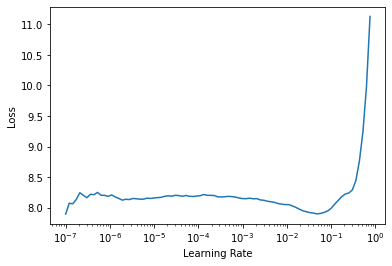

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,5.567198,4.185938,0.183752,0.387592,01:06
1,3.939260,3.132568,0.329099,0.591137,01:06
2,2.994306,2.503258,0.408567,0.706647,01:05
3,2.481098,2.162394,0.469129,0.768095,01:06
4,2.076248,1.991438,0.516691,0.784934,01:06
5,1.664357,1.762271,0.555687,0.827770,01:05
6,1.298704,1.696751,0.586706,0.841063,01:06
7,0.955786,1.578861,0.619498,0.859675,01:05
8,0.748326,1.555176,0.620679,0.862629,01:05
9,0.675831,1.560490,0.618021,0.862038,01:05


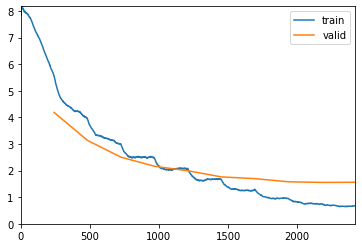

Path('/content/drive/My Drive/Houseplant Classifier/Models/stage-1-quick-effnetb3tf-mish.pth')

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-quick-effnetb3tf-mish')

Freezing model body
12,540,968 total parameters.
1,932,032 training parameters.


SuggestedLRs(lr_min=0.004786301031708717, lr_steep=1.5848931980144698e-06)

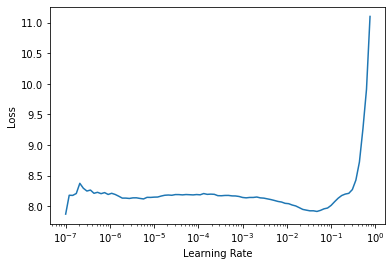

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,5.669744,4.311512,0.165731,0.365731,01:46
1,3.964008,3.183173,0.315510,0.584638,01:45
2,3.028847,2.588135,0.400000,0.690103,01:45
3,2.518208,2.278574,0.459084,0.742097,01:46
4,2.133934,1.984303,0.522895,0.797341,01:45
5,1.675576,1.845592,0.548597,0.812408,01:45
6,1.289688,1.674747,0.593796,0.844609,01:45
7,0.981300,1.583416,0.612112,0.858198,01:45
8,0.785963,1.547596,0.617725,0.860857,01:46
9,0.705586,1.541325,0.621270,0.860857,01:46


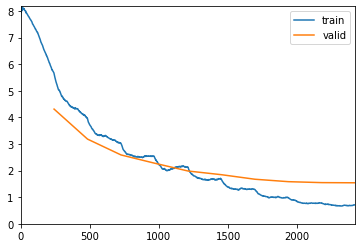

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-quick-effnetb3tf-mish')

Unfreezing model body
12,540,968 total parameters.
12,540,968 training parameters.


SuggestedLRs(lr_min=1.737800812406931e-06, lr_steep=3.981071586167673e-06)

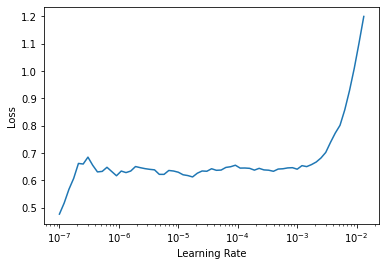

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,8.203527,7.229459,0.018021,0.066470,02:18
1,7.337960,6.426595,0.028951,0.093058,02:18
2,6.511776,5.647757,0.045199,0.135598,02:18
3,6.122855,5.274198,0.060266,0.174594,02:18
4,5.740144,5.022143,0.070310,0.211226,02:18
5,5.536127,4.882724,0.084195,0.236041,02:18
6,5.434624,4.780207,0.090694,0.251994,02:18
7,5.314573,4.711642,0.094535,0.257903,02:18
8,5.285044,4.692495,0.100148,0.264993,02:18
9,5.333918,4.711088,0.095716,0.264697,02:18


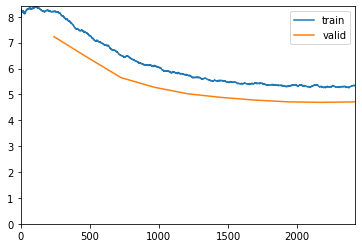

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-quick-effnetb3tf-mish')

# Efficientnet_b3 Mish Custom Split

In [ ]:
def effnet_split(m):
    "Default split of a model between body and head"
    return L(nn.Sequential(m[0][:3],m[0][3][:4]), nn.Sequential(m[0][3][4:],m[0][4:]), m[1:]).map(params)

learn = create_cnn_learner(pct_images=0.25, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b3_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'quickbaseline_effnetb3_mish.csv',
                           act_cls = 'Mish', 
                           splitter=effnet_split,
                           bs = 56
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 25.0% of the images (16940 images.)
We have 517 classes, with a training set of size 13555, and a validation set of size 3385
The main split has 80.00% training data with 518 classes, the reduced split has 80.02 % training data, with 517 classes.


Freezing model body
12,540,968 total parameters.
1,932,032 training parameters.


SuggestedLRs(lr_min=0.004786301031708717, lr_steep=1.5848931980144698e-06)

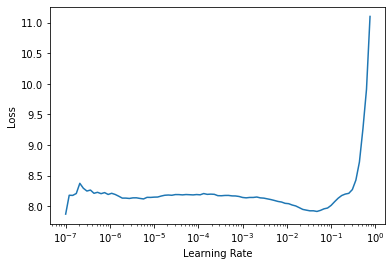

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,5.669744,4.311512,0.165731,0.365731,01:45
1,3.964008,3.183173,0.315510,0.584638,01:45
2,3.028847,2.588135,0.400000,0.690103,01:45
3,2.518208,2.278574,0.459084,0.742097,01:46
4,2.133934,1.984303,0.522895,0.797341,01:46
5,1.675576,1.845592,0.548597,0.812408,01:46
6,1.289688,1.674747,0.593796,0.844609,01:46
7,0.981300,1.583416,0.612112,0.858198,01:46
8,0.785963,1.547596,0.617725,0.860857,01:45
9,0.705586,1.541325,0.621270,0.860857,01:46


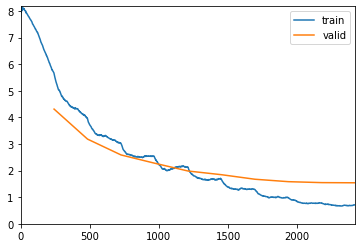

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-quick-effnetb3tf-mish-customsplit')

Unfreezing model body
12,540,968 total parameters.
12,540,968 training parameters.


SuggestedLRs(lr_min=1.737800812406931e-06, lr_steep=3.981071586167673e-06)

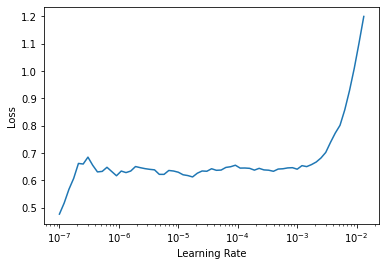

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,0.668836,1.543663,0.624520,0.862629,02:18
1,0.636122,1.528066,0.628360,0.867356,02:18
2,0.647264,1.524533,0.629838,0.868242,02:18
3,0.607241,1.517711,0.630724,0.871196,02:18
4,0.575094,1.507309,0.631315,0.870310,02:18
5,0.507600,1.514112,0.631905,0.872674,02:18
6,0.501612,1.507776,0.636041,0.874741,02:18
7,0.480788,1.500117,0.635746,0.869719,02:18
8,0.483593,1.500399,0.636041,0.871492,02:18
9,0.463050,1.506488,0.635155,0.869719,02:18


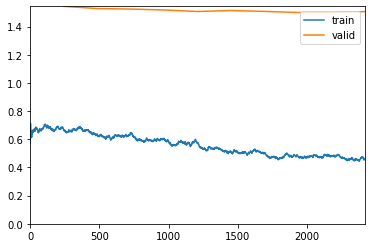

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-quick-effnetb3tf-mish-customsplit')

# Efficientnet_b5 Mish

In [ ]:
learn = create_cnn_learner(pct_images=0.25, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b5_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'quickbaseline_effnetb5_mish.csv',
                           act_cls = 'Mish', 
                           bs = 28
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 25.0% of the images (16940 images.)
We have 517 classes, with a training set of size 13555, and a validation set of size 3385
The main split has 80.00% training data with 518 classes, the reduced split has 80.02 % training data, with 517 classes.


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b5_ns-6f26d0cf.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b5_ns-6f26d0cf.pth


Freezing model body
30,711,856 total parameters.
2,543,808 training parameters.


SuggestedLRs(lr_min=0.002754228748381138, lr_steep=1.9054607491852948e-06)

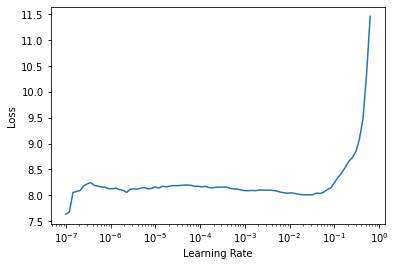

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,5.370991,4.399220,0.146824,0.364254,03:18
1,4.000424,3.358360,0.272674,0.550369,03:17
2,3.233397,2.689968,0.385820,0.667947,03:17
3,2.688760,2.297598,0.456721,0.750369,03:17
4,2.303113,1.972315,0.526145,0.796455,03:17
5,1.851610,1.759914,0.558346,0.826883,03:17
6,1.467585,1.616916,0.598818,0.852585,03:18
7,1.144672,1.530796,0.619202,0.862038,03:17
8,0.912123,1.492338,0.630133,0.868538,03:17
9,0.792068,1.480814,0.631019,0.872083,03:17


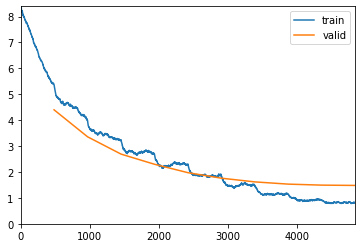

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-quick-effnetb5tf-mish')

Unfreezing model body
30,711,856 total parameters.
30,711,856 training parameters.


SuggestedLRs(lr_min=2.2908675418875645e-07, lr_steep=6.918309736647643e-06)

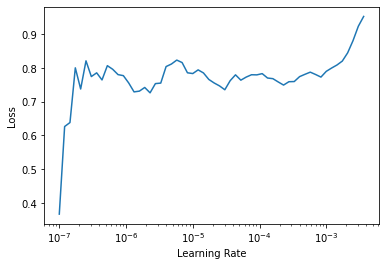

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,0.844677,1.478711,0.631315,0.870310,04:32
1,0.782905,1.463121,0.641950,0.872378,04:32
2,0.791548,1.461547,0.635451,0.872083,04:32
3,0.736899,1.457838,0.641359,0.873560,04:32
4,0.695847,1.448958,0.644609,0.877400,04:32
5,0.652958,1.453115,0.645790,0.872969,04:32
6,0.642242,1.447696,0.646086,0.874151,04:32
7,0.643375,1.430016,0.649335,0.876514,04:32
8,0.597062,1.428408,0.648449,0.879468,04:32
9,0.604334,1.445117,0.649335,0.878877,04:32


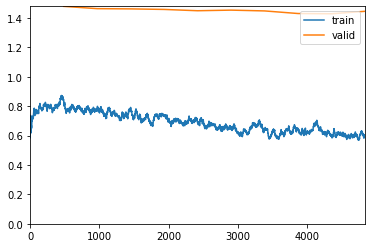

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-quick-effnetb5tf-mish')

# Effnetb5 Mish Custom Split

In [ ]:
printm()

Gen RAM Free: 24.4 GB  | Proc size: 3.1 GB
GPU RAM Free: 16270MB | Used: 10MB | Util   0% | Total 16280MB


In [ ]:
def effnet_split(m):
    "Default split of a model between body and head"
    return L(nn.Sequential(m[0][:3],m[0][3][:4]), nn.Sequential(m[0][3][4:],m[0][4:]), m[1:]).map(params)

learn = create_cnn_learner(pct_images=0.25, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b5_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'quickbaseline_effnetb5_mish.csv',
                           act_cls = 'Mish', 
                           splitter=effnet_split,
                           bs = 28
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 25.0% of the images (16940 images.)
We have 517 classes, with a training set of size 13555, and a validation set of size 3385
The main split has 80.00% training data with 518 classes, the reduced split has 80.02 % training data, with 517 classes.


Freezing model body
30,711,856 total parameters.
2,543,808 training parameters.


epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,5.370991,4.399220,0.146824,0.364254,03:18
1,4.000424,3.358360,0.272674,0.550369,03:18
2,3.233397,2.689968,0.385820,0.667947,03:18
3,2.688760,2.297598,0.456721,0.750369,03:18
4,2.303113,1.972315,0.526145,0.796455,03:18
5,1.851610,1.759914,0.558346,0.826883,03:18
6,1.467585,1.616916,0.598818,0.852585,03:18
7,1.144672,1.530796,0.619202,0.862038,03:18
8,0.912123,1.492338,0.630133,0.868538,03:19
9,0.792068,1.480814,0.631019,0.872083,03:19


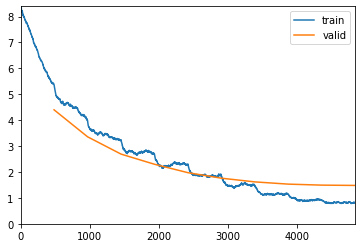

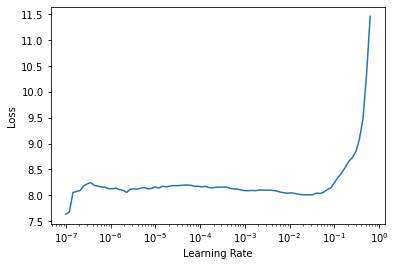

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-quick-effnetb5tf-mish-customsplit')

Unfreezing model body
30,711,856 total parameters.
30,711,856 training parameters.


epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,0.849024,1.475617,0.630724,0.871492,04:34
1,0.798710,1.462389,0.641359,0.870606,04:34
2,0.791889,1.461408,0.640768,0.876514,04:34
3,0.706613,1.455073,0.639882,0.878877,04:35
4,0.634292,1.446599,0.645495,0.875332,04:34
5,0.556942,1.443976,0.651108,0.873560,04:34
6,0.532409,1.442746,0.654653,0.877696,04:34
7,0.495487,1.419808,0.658493,0.881241,04:35
8,0.452239,1.417113,0.653767,0.882422,04:34
9,0.454127,1.435945,0.659380,0.880650,04:34


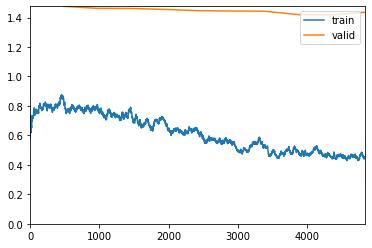

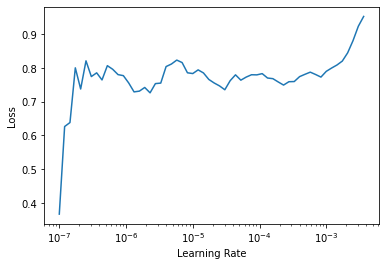

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-quick-effnetb5tf-mish-customsplit')

# Efficientnet_b7 Mish

In [ ]:
learn = create_cnn_learner(pct_images=0.25, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b7_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'quickbaseline_effnetb7_mish.csv',
                           act_cls = 'Mish', 
                           bs = 16
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 25.0% of the images (16940 images.)
We have 517 classes, with a training set of size 13555, and a validation set of size 3385
The main split has 80.00% training data with 518 classes, the reduced split has 80.02 % training data, with 517 classes.


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b7_ns-1dbc32de.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b7_ns-1dbc32de.pth


Freezing model body
66,684,368 total parameters.
3,208,128 training parameters.


SuggestedLRs(lr_min=1.0964781722577755e-07, lr_steep=9.12010818865383e-07)

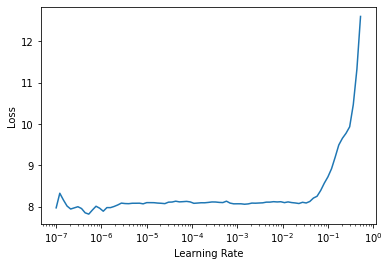

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,5.876558,5.211947,0.073264,0.207386,06:22
1,4.555626,3.926553,0.201773,0.433383,06:22
2,3.895329,3.170628,0.301920,0.580798,06:22
3,3.342561,2.617118,0.395273,0.680354,06:22
4,2.997901,2.269791,0.460857,0.748892,06:21
5,2.511156,1.978597,0.523191,0.792910,06:21
6,2.004993,1.840183,0.557755,0.814476,06:21
7,1.783355,1.704566,0.585229,0.831905,06:21
8,1.503344,1.639688,0.599409,0.841359,06:20
9,1.253010,1.627057,0.606204,0.843131,06:21


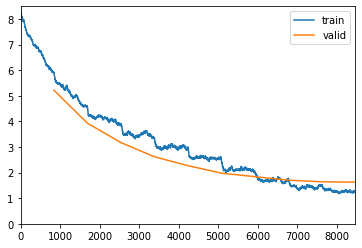

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-quick-effnetb7tf-mish')

In [ ]:
learn.load('stage-1-quick-effnetb7tf-mish')

Unfreezing model body
66,684,368 total parameters.
66,684,368 training parameters.


SuggestedLRs(lr_min=1.3182566908653825e-05, lr_steep=2.75422871709452e-06)

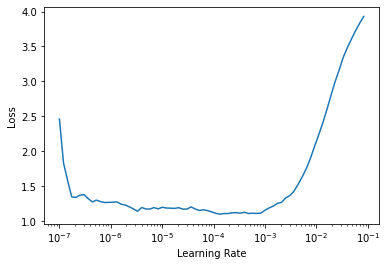

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,1.291867,1.628018,0.604136,0.844018,09:04
1,1.208119,1.612263,0.602068,0.847563,09:02
2,1.128630,1.578438,0.614476,0.850517,09:02
3,1.062330,1.580447,0.617725,0.851108,09:02
4,0.959666,1.571372,0.616248,0.853767,09:02
5,0.962988,1.589879,0.613294,0.849631,09:01
6,1.024101,1.570114,0.615066,0.852289,09:01
7,1.049176,1.569518,0.616839,0.850517,09:00
8,0.951099,1.569962,0.615657,0.857607,09:01
9,0.985754,1.570233,0.618316,0.854357,09:01


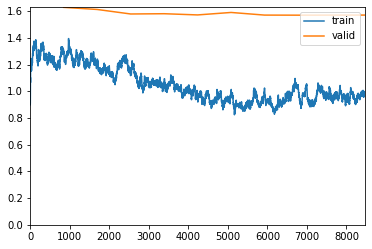

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-quick-effnetb7tf-mish')

# EfficientNet b7 Mish Custom Split

In [ ]:
printm()

Gen RAM Free: 24.4 GB  | Proc size: 3.1 GB
GPU RAM Free: 16270MB | Used: 10MB | Util   0% | Total 16280MB


In [ ]:
def effnet_split(m):
    "Default split of a model between body and head"
    return L(nn.Sequential(m[0][:3],m[0][3][:4]), nn.Sequential(m[0][3][4:],m[0][4:]), m[1:]).map(params)

learn = create_cnn_learner(pct_images=0.25, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b7_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'quickbaseline_effnetb7_mish.csv',
                           act_cls = 'Mish', 
                           splitter=effnet_split,
                           bs = 16
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 25.0% of the images (16940 images.)
We have 517 classes, with a training set of size 13555, and a validation set of size 3385
The main split has 80.00% training data with 518 classes, the reduced split has 80.02 % training data, with 517 classes.


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b7_ns-1dbc32de.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b7_ns-1dbc32de.pth


Freezing model body
66,684,368 total parameters.
3,208,128 training parameters.


SuggestedLRs(lr_min=1.0964781722577755e-07, lr_steep=9.12010818865383e-07)

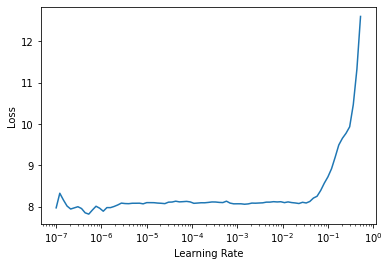

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,5.876558,5.211947,0.073264,0.207386,06:20
1,4.555626,3.926553,0.201773,0.433383,06:20
2,3.895329,3.170628,0.301920,0.580798,06:20
3,3.342561,2.617118,0.395273,0.680354,06:20
4,2.997901,2.269791,0.460857,0.748892,06:20
5,2.511156,1.978597,0.523191,0.792910,06:20
6,2.004993,1.840183,0.557755,0.814476,06:20
7,1.783355,1.704566,0.585229,0.831905,06:20
8,1.503344,1.639688,0.599409,0.841359,06:20
9,1.253010,1.627057,0.606204,0.843131,06:20


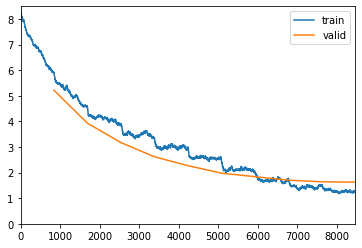

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-quick-effnetb7tf-mish-customsplit')

Unfreezing model body
66,684,368 total parameters.
66,684,368 training parameters.


SuggestedLRs(lr_min=6.309573450380412e-08, lr_steep=9.12010818865383e-07)

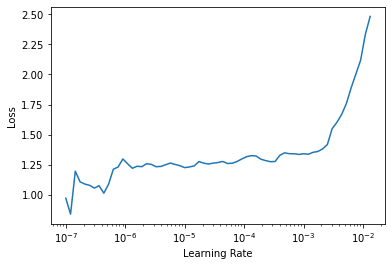

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,1.319398,1.620977,0.606204,0.843722,09:01
1,1.316257,1.607540,0.605318,0.843722,09:01
2,1.319599,1.593933,0.610635,0.848449,09:01
3,1.173091,1.590083,0.612703,0.852585,09:01
4,1.038256,1.556681,0.623929,0.856425,09:00
5,0.886152,1.562673,0.620384,0.858789,09:01
6,0.806084,1.540729,0.625997,0.862925,09:01
7,0.781454,1.529688,0.630724,0.864993,09:01
8,0.722123,1.515006,0.631019,0.863220,09:01
9,0.677351,1.535161,0.633087,0.861152,09:01


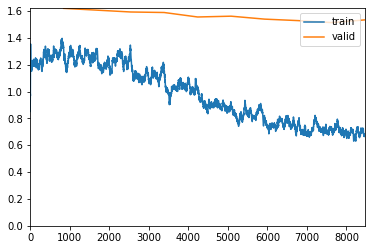

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-quick-effnetb7tf-mish-customsplit')

# Examine Training Loop 

In [ ]:
def get_ordered_cbs(cbs, step):
    return [cb for cb in sort_by_run(cbs) if hasattr(cb, step)]

@patch
def show_training_loop(learn:Learner):
    loop = ['Start Fit', 'begin_fit', 'Start Epoch Loop', 'begin_epoch',
            'Start Train', 'begin_train', 'Start Batch Loop', 'begin_batch', 
            'after_pred', 'after_loss', 'after_backward', 'after_step', 
            'after_cancel_batch', 'after_batch','End Batch Loop',
            'End Train', 'after_cancel_train', 'after_train',
            'Start Valid', 'begin_validate',
            'Start Batch Loop', '**CBs same as train batch**', 'End Batch Loop',
            'End Valid', 'after_cancel_validate', 'after_validate',
            'End Epoch Loop', 'after_cancel_epoch', 'after_epoch', 'End Fit', 'after_cancel_fit', 'after_fit']
    indent = 0
    for s in loop:
        if s.startswith('Start'): print(f'{" "*indent}{s}'); indent += 2
        elif s.startswith('End'): indent -= 2; print(f'{" "*indent}{s}')
        else: print(f'{" "*indent} - {s:15}:', get_ordered_cbs(learn.cbs, s))

In [ ]:
show_training_loop(learn)

Start Fit
   - begin_fit      : [TrainEvalCallback, Recorder, ProgressCallback, CSVLogger, ShowGraphCallback]
  Start Epoch Loop
     - begin_epoch    : [Recorder, ProgressCallback]
    Start Train
       - begin_train    : [TrainEvalCallback, Recorder, ProgressCallback]
      Start Batch Loop
         - begin_batch    : []
         - after_pred     : []
         - after_loss     : []
         - after_backward : []
         - after_step     : []
         - after_cancel_batch: []
         - after_batch    : [TrainEvalCallback, Recorder, ProgressCallback]
      End Batch Loop
    End Train
     - after_cancel_train: [Recorder]
     - after_train    : [Recorder, ProgressCallback, ShowGraphCallback]
    Start Valid
       - begin_validate : [TrainEvalCallback, Recorder, ProgressCallback]
      Start Batch Loop
         - **CBs same as train batch**: []
      End Batch Loop
    End Valid
     - after_cancel_validate: [Recorder]
     - after_validate : [Recorder, ProgressCallback]
  End Epoc

# Final Train - Baseline Effnetb5 Mish Custom Split

In [ ]:
def effnet_split(m):
    "Default split of a model between body and head"
    return L(nn.Sequential(m[0][:3],m[0][3][:4]), nn.Sequential(m[0][3][4:],m[0][4:]), m[1:]).map(params)

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b5_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'quickbaseline_effnetb5_mish.csv',
                           act_cls = 'Mish', 
                           splitter=effnet_split,
                           bs = 28
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 100% of the images (68519 images.)
We have 517 classes, with a training set of size 54962, and a validation set of size 13557
The main split has 80.00% training data with 518 classes, the reduced split has 80.21 % training data, with 517 classes.


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b5_ns-6f26d0cf.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b5_ns-6f26d0cf.pth


Freezing model body
30,711,856 total parameters.
2,543,808 training parameters.


SuggestedLRs(lr_min=0.003981071710586548, lr_steep=0.007585775572806597)

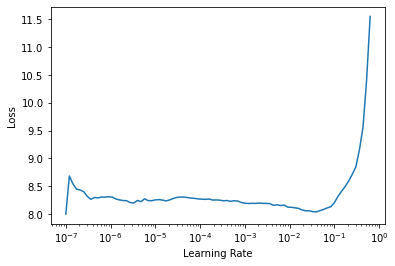

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,3.920624,3.163245,0.306853,0.585528,13:57
1,3.180316,2.549617,0.407170,0.704728,13:57
2,2.964718,2.223510,0.475326,0.754813,13:59
3,2.690981,2.090785,0.497676,0.773401,13:58
4,2.473935,1.852284,0.549900,0.810209,13:59
5,2.202080,1.676601,0.587519,0.835878,13:58
6,1.941817,1.529043,0.620122,0.851958,13:58
7,1.640304,1.424366,0.641514,0.869071,13:58
8,1.486171,1.361502,0.658774,0.875415,13:58
9,1.423145,1.340673,0.659881,0.879472,13:58


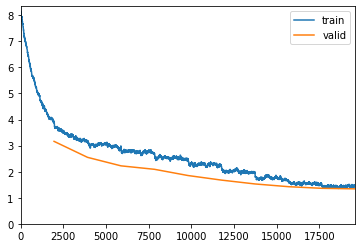

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-final-effnetb5tf-mish-customsplit')

Unfreezing model body
30,711,856 total parameters.
30,711,856 training parameters.


SuggestedLRs(lr_min=1.0964781722577755e-07, lr_steep=7.585775847473997e-07)

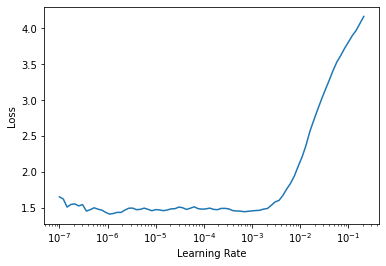

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,1.415433,1.334247,0.662388,0.880505,18:31
1,1.433577,1.319755,0.667035,0.880357,18:30
2,1.350105,1.300391,0.670207,0.885520,18:31
3,1.254131,1.278234,0.674117,0.887807,18:33
4,1.148235,1.261501,0.679501,0.889725,18:33
5,1.042516,1.246499,0.683853,0.892380,18:31
6,0.998806,1.237090,0.685697,0.895405,18:33
7,0.932935,1.237441,0.684812,0.894593,18:32
8,0.949375,1.233326,0.686140,0.894814,18:34
9,0.913648,1.224506,0.689533,0.896363,18:34


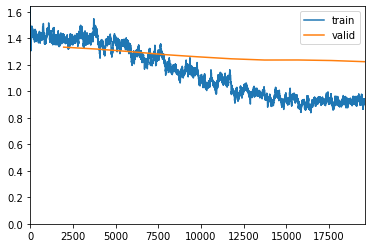

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-final-effnetb5tf-mish-customsplit')

# Final Train - Baseline Effnetb5 Mish Custom Split - Cutmix

In [ ]:
def effnet_split(m):
    "Default split of a model between body and head"
    return L(nn.Sequential(m[0][:3],m[0][3][:4]), nn.Sequential(m[0][3][4:],m[0][4:]), m[1:]).map(params)

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b5_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'final_cutmix.csv',
                           act_cls = 'Mish', 
                           splitter=effnet_split,
                           bs = 28,
                           cutmix=CutMix(1.0)
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 100% of the images (68519 images.)
We have 517 classes, with a training set of size 54962, and a validation set of size 13557
The main split has 80.00% training data with 518 classes, the reduced split has 80.21 % training data, with 517 classes.


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b5_ns-6f26d0cf.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b5_ns-6f26d0cf.pth


Freezing model body
30,711,856 total parameters.
2,543,808 training parameters.


SuggestedLRs(lr_min=0.002290867641568184, lr_steep=6.309573450380412e-07)

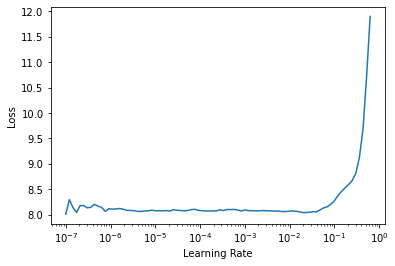

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,4.848392,3.623876,0.235672,0.504536,11:49
1,4.361010,2.932107,0.359519,0.653021,11:50
2,4.106925,2.510372,0.443535,0.724718,11:52
3,3.883454,2.366865,0.455337,0.742495,11:52
4,3.583933,2.079235,0.515306,0.783359,11:52
5,3.591766,1.924579,0.543336,0.810725,11:53
6,3.405301,1.755770,0.590544,0.837427,11:52
7,3.082132,1.633832,0.613484,0.851663,11:54
8,3.041440,1.544613,0.633031,0.862285,11:54
9,2.888077,1.519204,0.635170,0.864350,11:53


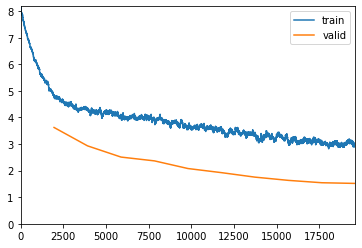

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-final-effb5-Mish-customsplit-cutmix')

Unfreezing model body
30,711,856 total parameters.
30,711,856 training parameters.


SuggestedLRs(lr_min=1.58489319801447e-07, lr_steep=1.0964781722577754e-06)

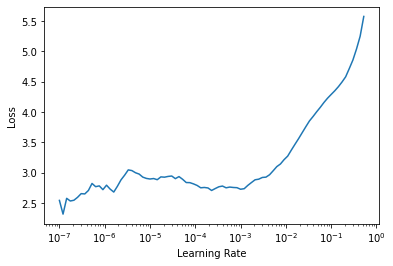

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,2.892992,1.511705,0.640628,0.866195,16:56
1,3.022905,1.478701,0.647120,0.871358,16:55
2,3.041278,1.430843,0.655971,0.875267,16:53
3,2.934844,1.409769,0.659512,0.880136,16:51
4,2.824446,1.379659,0.663864,0.883381,16:49
5,2.752534,1.346411,0.671019,0.885963,16:50
6,2.676502,1.328669,0.675961,0.889725,16:48
7,2.681505,1.307189,0.677362,0.890167,16:48
8,2.572747,1.309406,0.677952,0.890831,16:48
9,2.635449,1.306429,0.678764,0.890831,16:48


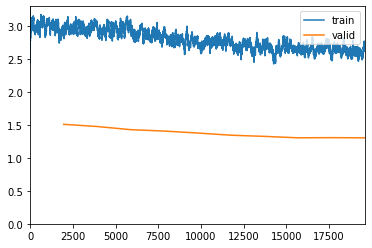

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-final-effb5-Mish-customsplit-cutmix')

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,2.710632,1.316415,0.679723,0.890094,16:50
1,2.635664,1.311542,0.677731,0.889651,16:49
2,2.672415,1.300685,0.680534,0.893856,16:47
3,2.671769,1.280406,0.681493,0.894888,16:47
4,2.590763,1.261516,0.684443,0.895331,16:47
5,2.658921,1.258804,0.689164,0.897396,16:50
6,2.421803,1.225694,0.692557,0.901232,16:51
7,2.557574,1.222958,0.693295,0.900642,16:53
8,2.413022,1.224936,0.692557,0.900642,16:53
9,2.544179,1.229851,0.693074,0.899683,16:53


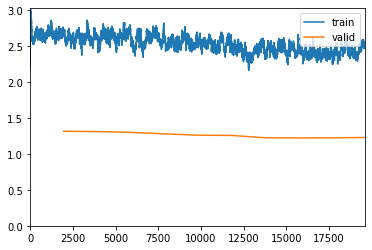

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-3-final-effb5-Mish-customsplit-cutmix')

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,2.493788,1.231528,0.692410,0.901527,16:50
1,2.598306,1.231952,0.693811,0.900125,16:47
2,2.456589,1.241559,0.687763,0.900052,16:47
3,2.495821,1.226449,0.690123,0.900789,16:47
4,2.354923,1.211920,0.697647,0.902633,16:48
5,2.284049,1.202204,0.699491,0.902855,16:49
6,2.265140,1.183844,0.702442,0.905068,16:48
7,2.075523,1.177284,0.702294,0.906838,16:48
8,2.354203,1.177816,0.703179,0.904920,16:50
9,2.178290,1.172019,0.703032,0.905953,16:51


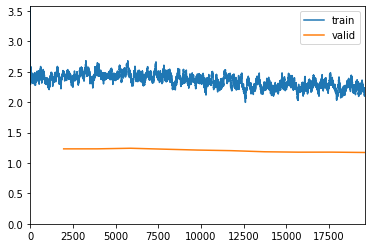

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-4-final-effb5-Mish-customsplit-cutmix')

# Final Train - Baseline Effnetb5 Mish Custom Split - Label Smoothing

In [ ]:
def effnet_split(m):
    "Default split of a model between body and head"
    return L(nn.Sequential(m[0][:3],m[0][3][:4]), nn.Sequential(m[0][3][4:],m[0][4:]), m[1:]).map(params)

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b5_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'final_effb5_mish_cs_ls.csv',
                           act_cls = 'Mish', 
                           splitter=effnet_split,
                           bs = 28,
                           loss_func=LabelSmoothingCrossEntropy()
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 100% of the images (68519 images.)
We have 517 classes, with a training set of size 54962, and a validation set of size 13557
The main split has 80.00% training data with 518 classes, the reduced split has 80.21 % training data, with 517 classes.


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b5_ns-6f26d0cf.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b5_ns-6f26d0cf.pth


Freezing model body
30,711,856 total parameters.
2,543,808 training parameters.


SuggestedLRs(lr_min=0.003981071710586548, lr_steep=0.007585775572806597)

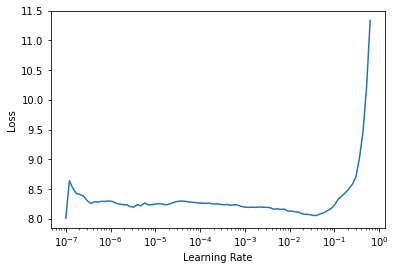

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,4.333192,3.744172,0.306631,0.584053,11:44
1,3.756334,3.259266,0.400605,0.691008,11:44
2,3.580973,3.013748,0.461533,0.742052,11:44
3,3.375798,2.834321,0.503651,0.778860,11:44
4,3.180015,2.654493,0.553736,0.811020,11:44
5,2.979878,2.546178,0.575349,0.832043,11:44
6,2.783606,2.385587,0.618573,0.857491,11:45
7,2.549789,2.314848,0.642399,0.868629,11:44
8,2.415036,2.259485,0.656561,0.877259,11:44
9,2.362121,2.242888,0.659881,0.878956,11:44


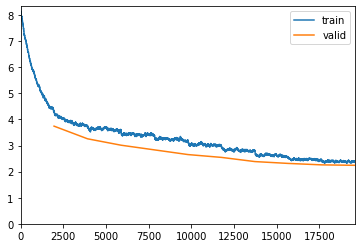

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-final-effb5-Mish-customsplit-labelsmooth')

Unfreezing model body
30,711,856 total parameters.
30,711,856 training parameters.


SuggestedLRs(lr_min=6.309573450380412e-08, lr_steep=5.754399353463668e-06)

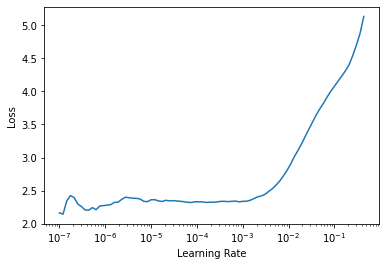

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,2.369588,2.237578,0.658774,0.879398,16:44
1,2.373158,2.221977,0.664085,0.882644,16:45
2,2.322250,2.198238,0.670945,0.883455,16:47
3,2.264293,2.166268,0.679649,0.886406,16:47
4,2.187499,2.152095,0.683853,0.890536,16:47
5,2.102935,2.131726,0.690639,0.893413,16:45
6,2.000119,2.123798,0.691967,0.895257,16:50
7,2.060737,2.115313,0.692041,0.895773,16:57
8,1.984130,2.110959,0.694549,0.897249,16:57
9,1.932279,2.111502,0.693516,0.897691,16:50


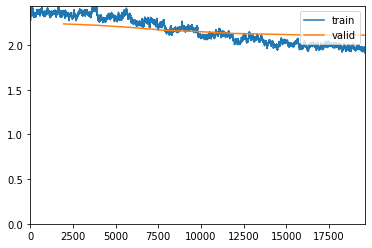

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-final-effb5-Mish-customsplit-labelsmooth')

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,1.995051,2.115161,0.694770,0.896216,16:55
1,1.999310,2.128704,0.689386,0.894446,16:56
2,2.001541,2.127491,0.688058,0.894519,16:58
3,1.966915,2.116046,0.692189,0.899019,16:56
4,1.942189,2.108382,0.693516,0.897470,16:57
5,1.829890,2.098356,0.695287,0.900642,16:58
6,1.822273,2.091176,0.698237,0.900568,16:50
7,1.786597,2.094585,0.697942,0.901379,16:59
8,1.764678,2.091953,0.695434,0.901748,16:51
9,1.773380,2.091300,0.698385,0.900347,16:56


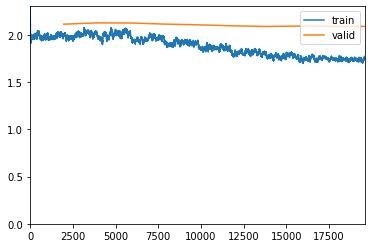

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-3-final-effb5-Mish-customsplit-labelsmooth')

Unfreezing model body
30,711,856 total parameters.
30,711,856 training parameters.


SuggestedLRs(lr_min=9.12010818865383e-08, lr_steep=7.585775847473997e-07)

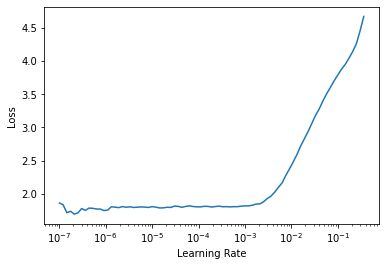

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,1.752031,2.097319,0.698606,0.899388,18:26
1,1.814216,2.113588,0.694254,0.897913,18:27
2,1.780477,2.118110,0.692631,0.897175,18:27
3,1.766431,2.117055,0.690418,0.896585,18:27
4,1.694771,2.120399,0.689164,0.900420,18:26
5,1.647873,2.112278,0.693738,0.899314,18:21
6,1.635879,2.108030,0.695360,0.899757,18:19
7,1.591719,2.113723,0.694475,0.899240,18:20
8,1.593421,2.110239,0.692705,0.899462,18:21
9,1.557358,2.104778,0.694328,0.901601,18:18


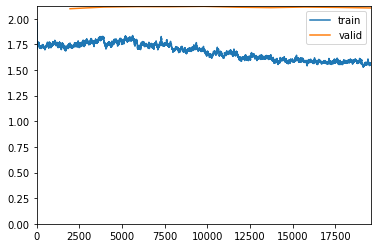

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-4-final-effb5-Mish-customsplit-labelsmooth')

# Final Train - Baseline Effnetb5 Mish Custom Split - Label Smoothing+Cutmix

In [ ]:
def effnet_split(m):
    "Default split of a model between body and head"
    return L(nn.Sequential(m[0][:3],m[0][3][:4]), nn.Sequential(m[0][3][4:],m[0][4:]), m[1:]).map(params)

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b5_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'final_cutmix.csv',
                           act_cls = 'Mish', 
                           splitter=effnet_split,
                           bs = 28,
                           loss_func=LabelSmoothingCrossEntropy(),
                           cutmix=CutMix(1.0)
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 100% of the images (68519 images.)
We have 517 classes, with a training set of size 54962, and a validation set of size 13557
The main split has 80.00% training data with 518 classes, the reduced split has 80.21 % training data, with 517 classes.


Freezing model body
30,711,856 total parameters.
2,543,808 training parameters.


SuggestedLRs(lr_min=0.002290867641568184, lr_steep=6.309573450380412e-07)

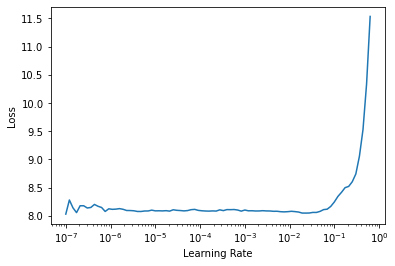

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,5.109629,4.088755,0.240171,0.504389,13:24
1,4.706717,3.515331,0.349709,0.650513,13:22
2,4.490676,3.238711,0.413956,0.704654,13:21
3,4.307705,3.024968,0.459541,0.743085,13:21
4,4.062188,2.814006,0.510954,0.779376,13:23
5,4.045132,2.676388,0.544368,0.809987,13:23
6,3.909558,2.524981,0.591429,0.835141,13:22
7,3.647527,2.424017,0.614221,0.850483,13:22
8,3.605305,2.358684,0.633178,0.860957,13:22
9,3.465541,2.340437,0.637752,0.862654,13:23


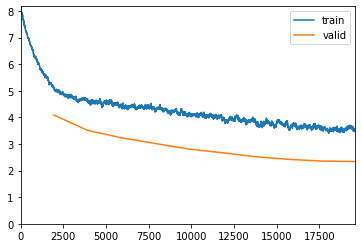

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-final-effb5-Mish-customsplit-cutmix-labelsmooth')

Unfreezing model body
30,711,856 total parameters.
30,711,856 training parameters.


SuggestedLRs(lr_min=1.58489319801447e-07, lr_steep=5.248074739938602e-05)

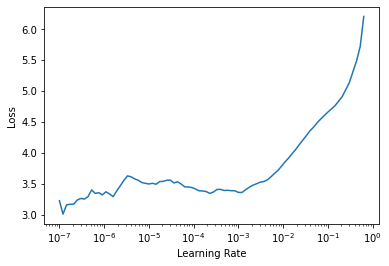

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,3.481623,2.326210,0.639596,0.864350,18:22
1,3.531982,2.299598,0.646013,0.870252,18:23
2,3.613852,2.276174,0.652652,0.873128,18:23
3,3.471095,2.232407,0.658700,0.877480,18:24
4,3.424783,2.211611,0.668437,0.883381,18:23
5,3.351927,2.185971,0.672273,0.885963,18:23
6,3.276794,2.171778,0.675149,0.888323,18:23
7,3.253710,2.159522,0.678469,0.890167,18:23
8,3.199581,2.154634,0.681124,0.888028,18:23
9,3.212073,2.153289,0.680829,0.890610,18:22


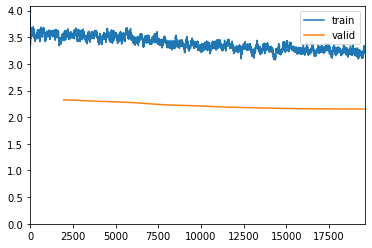

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-final-effb5-Mish-customsplit-cutmix-labelsmooth')

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,3.273082,2.157613,0.679944,0.888618,18:22
1,3.233601,2.154604,0.679575,0.891200,18:25
2,3.249948,2.152377,0.679206,0.891348,18:20
3,3.260392,2.132992,0.683853,0.893856,18:20
4,3.208839,2.111966,0.687837,0.896068,18:23
5,3.320235,2.105755,0.690049,0.897322,18:25
6,3.103979,2.082924,0.694549,0.898945,18:25
7,3.202811,2.081192,0.693738,0.900052,18:25
8,3.065410,2.081200,0.694696,0.901822,18:25
9,3.179957,2.084734,0.694918,0.900125,18:23


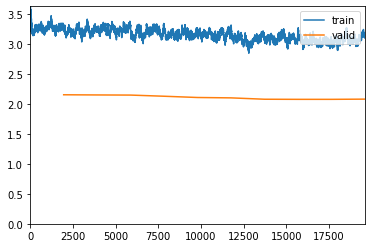

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-3-final-effb5-Mish-customsplit-cutmix-labelsmooth')

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,3.143766,2.088830,0.694033,0.900494,18:23
1,3.223552,2.088738,0.693147,0.899904,18:23
2,3.076744,2.091471,0.689902,0.900052,18:23
3,3.106508,2.076851,0.692926,0.901158,18:22
4,3.006918,2.062825,0.698606,0.903592,18:21
5,2.989659,2.054116,0.699417,0.904625,18:23
6,2.943437,2.052445,0.699860,0.905363,18:26
7,2.767906,2.034387,0.702073,0.905363,18:24
8,3.008850,2.038504,0.703548,0.905805,18:24
9,2.900938,2.036315,0.703105,0.907649,18:23


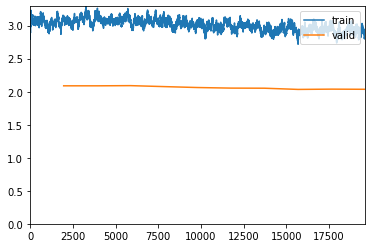

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-4-final-effb5-Mish-customsplit-cutmix-labelsmooth')

# Final Train - Baseline Effnetb5 Mish Custom Split - Label Smoothing+Cutmix - 40 Epoch - LR2


In [ ]:
def effnet_split(m):
    "Default split of a model between body and head"
    return L(nn.Sequential(m[0][:3],m[0][3][:4]), nn.Sequential(m[0][3][4:],m[0][4:]), m[1:]).map(params)

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=224, 
                           arch = 'tf_efficientnet_b5_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'final_effb5_mish_cs_ls_cutmix_40epoch.csv',
                           act_cls = 'Mish', 
                           splitter=effnet_split,
                           bs = 28,
                           loss_func=LabelSmoothingCrossEntropy(),
                           cutmix=CutMix(1.0)
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 100% of the images (68519 images.)
We have 517 classes, with a training set of size 54962, and a validation set of size 13557
The main split has 80.00% training data with 518 classes, the reduced split has 80.21 % training data, with 517 classes.


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b5_ns-6f26d0cf.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientnet_b5_ns-6f26d0cf.pth


Freezing model body
30,711,856 total parameters.
2,543,808 training parameters.


SuggestedLRs(lr_min=0.003981071710586548, lr_steep=6.309573450380412e-07)

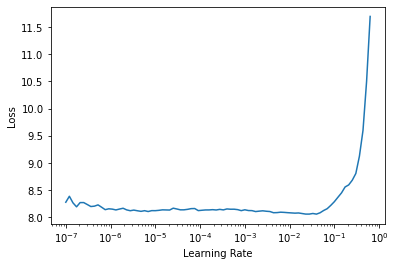

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,5.106163,4.070118,0.241425,0.514052,10:54
1,4.711540,3.501689,0.353544,0.661430,10:55
2,4.493612,3.193285,0.429815,0.715645,10:56
3,4.311374,3.004056,0.467065,0.747806,10:57
4,4.058947,2.792119,0.518699,0.786310,10:56
5,4.030071,2.664267,0.550122,0.812127,10:56
6,3.928568,2.510702,0.591429,0.840820,10:56
7,3.636760,2.413226,0.615992,0.853139,10:56
8,3.582120,2.353276,0.634875,0.861769,10:57
9,3.445244,2.336026,0.639153,0.863687,10:56


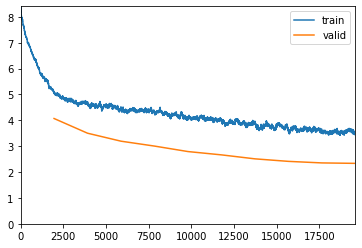

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-final-effb5-Mish-customsplit-cutmix-labelsmooth-40epoch')

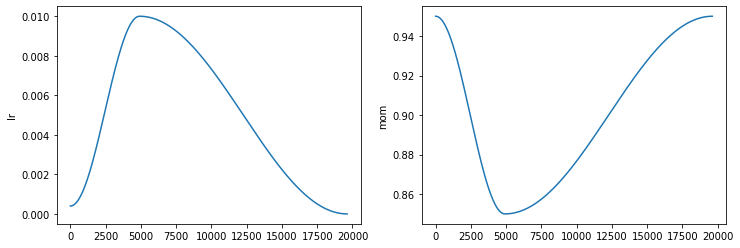

In [ ]:
learn.recorder.plot_sched()

Unfreezing model body
30,711,856 total parameters.
30,711,856 training parameters.


SuggestedLRs(lr_min=1.58489319801447e-07, lr_steep=1.0964781722577754e-06)

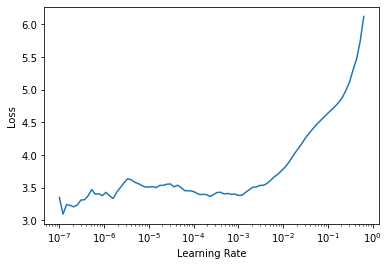

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,time
0,3.467048,2.317544,0.643284,0.865752,16:03
1,3.519050,2.300082,0.645349,0.868186,16:03
2,3.605443,2.277270,0.653463,0.871801,16:03
3,3.494373,2.248214,0.656045,0.876300,16:02
4,3.492692,2.228024,0.658479,0.878661,16:03
5,3.414323,2.212997,0.658036,0.882570,16:05
6,3.330707,2.212257,0.660323,0.882717,16:06
7,3.338781,2.179756,0.662167,0.885004,16:04
8,3.219870,2.174179,0.667183,0.886184,16:02
9,3.193639,2.123546,0.678985,0.893044,16:02


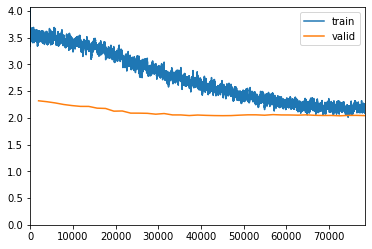

In [ ]:
learn.fit_one_cycle(40, lr_max=slice(5e-5, 5e-4))
learn.save('stage-2-final-effb5-Mish-customsplit-cutmix-labelsmooth-40epoch')

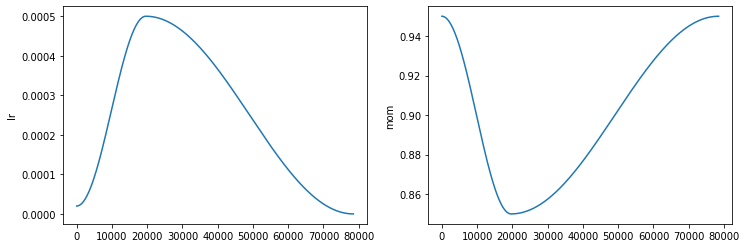

In [ ]:
learn.recorder.plot_sched()

# Final Train - 448px Final Train - Baseline Effnetb5 Mish Custom Split

50 minutes per epoch, batch size only 8 - not worth running

In [ ]:
def effnet_split(m):
    "Default split of a model between body and head"
    return L(nn.Sequential(m[0][:3],m[0][3][:4]), nn.Sequential(m[0][3][4:],m[0][4:]), m[1:]).map(params)

learn = create_cnn_learner(pct_images=1, 
                           deterministic=True, 
                           size=448, 
                           arch = 'tf_efficientnet_b5_ns',
                           pretrained=True,
                           img_path ='/content/plant_images_database_manualcleanedlosses10/', 
                           log_name = 'quickbaseline_effnetb5_mish.csv',
                           act_cls = 'Mish', 
                           splitter=effnet_split,
                           bs = 8
                           )

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_images_database_manualcleanedlosses10/, using 100% of the images (68519 images.)
We have 517 classes, with a training set of size 54962, and a validation set of size 13557
The main split has 80.00% training data with 518 classes, the reduced split has 80.21 % training data, with 517 classes.


Freezing model body
30,711,856 total parameters.
2,543,808 training parameters.


SuggestedLRs(lr_min=9.12010818865383e-08, lr_steep=3.630780702224001e-05)

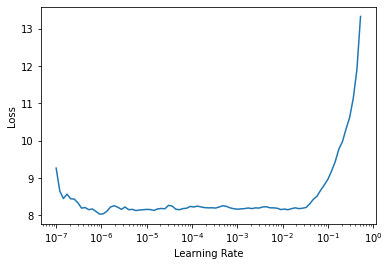

In [ ]:
print(f'Freezing model body')
learn.freeze()
enumerate_params()
learn.lr_find()

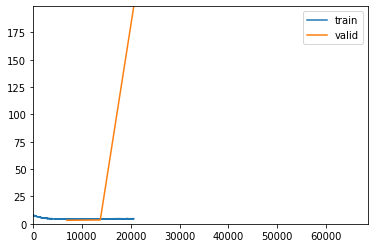

IndexError: ignored

In [ ]:
learn.fit_one_cycle(10, 1e-2)
learn.save('stage-1-final-effnetb5tf-mish-customsplit-448px')

In [ ]:
print(f'Unfreezing model body')
learn.unfreeze()
enumerate_params()
learn.lr_find()

In [ ]:
learn.fit_one_cycle(10, lr_max=slice(1e-5, 1e-4))
learn.save('stage-2-final-effnetb5tf-mish-customsplit-448px')

# Interpretation

In [ ]:
learn = create_cnn_learner(size=224, bs=64, pct_images=1, deterministic=True, img_path='/content/plant_image_database/')

Random state set:101, cuda used: True
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)
Using dataframe to prepare stratified 5 fold split, random state is 101. Returning fold 0.
Creating path:label dataframe from /content/plant_image_database/, using 100% of the images (77700 images.)


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


We have 518 classes, with a training set of size 62160, and a validation set of size 15540


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


In [ ]:
learn.load('/content/drive/My Drive/Houseplant Classifier/Models/stage-2-150images');

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


In [ ]:
# This will crash the kernel
#interp.plot_confusion_matrix()

In [ ]:
# What classes were confused with each other most frequently, min_val is the minimum number of times confused
# If the model fails to predict a class, this method will throw an error.
  # This can happen if you create a dataloader with insufficient data, or if significant class confusion (e.g. due to mislabelling)
interp.most_confused(min_val = 20)

A confusion matrix is of limited use with so many categories. Indeed, we will crash the kernel trying to plot out such a dense confusion matrix. Luckily, fast.ai v2 has a useful plot_top_losses method that shows us some of the images that suprised the model the most (leading to the largest losses). 

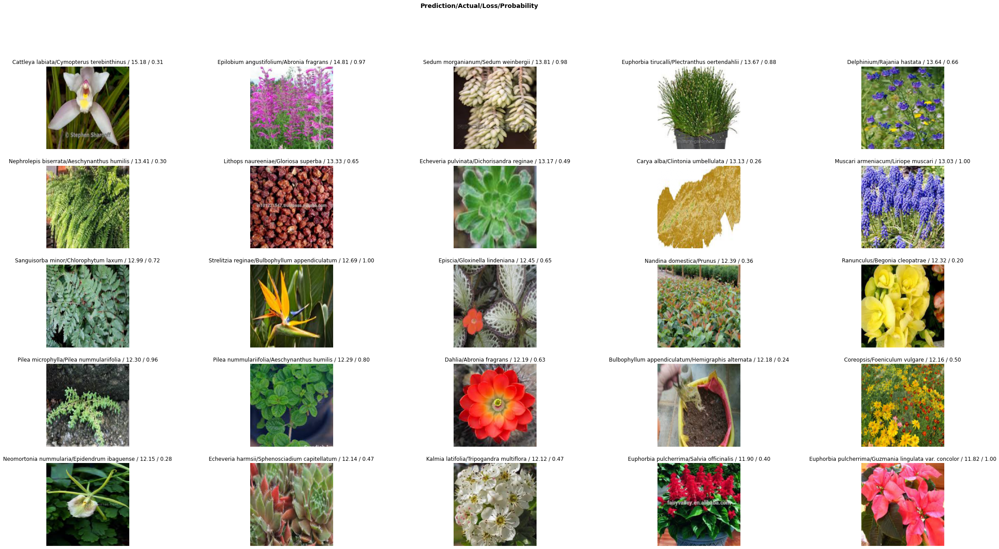

In [ ]:
interp.plot_top_losses(25, figsize=(40,20))

We can see that many of these image labels are simply incorrect. 
A classification report detailing the F1 score for each class can help us identify classes that the model is struggling with. As fastai v2 will print out the classification report, we should intercept this with a jupyter magic command, and read that input back into a dataframe for interpretation.

In [ ]:
# Use a jupyter magic command to capture the print output from the classification report
%%capture cap_out --no-stderr
interp.print_classification_report()

In [ ]:
classification_report = cap_out.stdout

In [ ]:
from itertools import groupby
class_report = pd.DataFrame([])
def split_text(s):
    for k, g in groupby(s, str.isnumeric):
        yield ''.join(g)

report = []
for item in classification_report.split('\n'):
  report.append(split_text(item))

report = pd.DataFrame(report).copy()
class_report = pd.DataFrame([])
class_report['Class'] = pd.DataFrame(report).iloc[2:learn.dl.c+2,0]
class_report['Precision'] = pd.DataFrame(report).iloc[2:learn.dl.c+2,3].apply(lambda x:int(x)/100)
class_report['Recall'] = pd.DataFrame(report).iloc[2:learn.dl.c+2,7].apply(lambda x:int(x)/100)
class_report['F1 Score'] = pd.DataFrame(report).iloc[2:learn.dl.c+2,11].apply(lambda x:int(x)/100)
class_report['Support'] = pd.DataFrame(report).iloc[2:learn.dl.c+2,13]

In [ ]:
class_report.sort_values('F1 Score')

,Class,Precision,Recall,F1 Score,Support
505,Tripogandra multiflora,0.00,0.00,0.00,18
376,Peperomia peltifolia,0.00,0.00,0.00,20
190,Dracaena,0.00,0.00,0.00,18
429,Rajania hastata,0.00,0.00,0.00,10
356,Oleaceae,0.11,0.04,0.06,23
...,...,...,...,...,...
318,Lilium philadelphicum,0.92,0.88,0.90,26
186,Digitalis purpurea,0.90,0.93,0.91,28
38,Aphelandra squarrosa,0.92,0.89,0.91,27
189,Dionaea muscipula,0.90,0.96,0.93,27


With this, we can see at a glance which classes have the most problems being identified, and have a closer look at the images in their folders.

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


There are 11 classes with F1 scores below 0.20


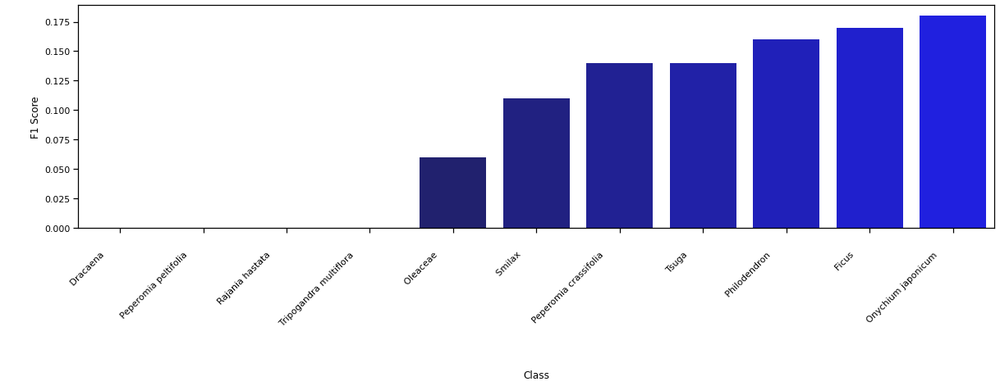

In [ ]:
import seaborn as sns
sns.set_context("notebook")
ordered_fscore = class_report[class_report['F1 Score']<0.2].sort_values('F1 Score')
fig, ax = plt.subplots(figsize=(20,5))
sequential_colors = sns.dark_palette('blue', len(ordered_fscore))
chart = sns.barplot(ax=ax, x=ordered_fscore['Class'], y=ordered_fscore['F1 Score'], palette = sequential_colors);
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right');
print(f'There are {len(ordered_fscore)} classes with F1 scores below 0.20')

There are 68 classes with F1 scores more than 0.80


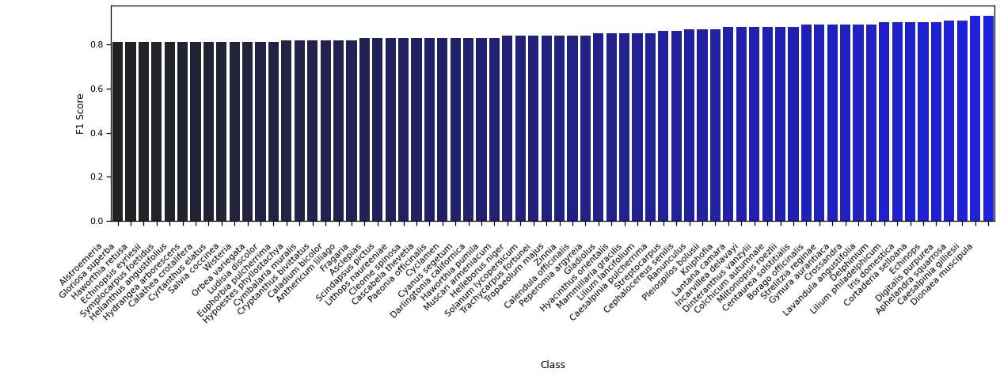

In [ ]:
import seaborn as sns
ordered_fscore = class_report[class_report['F1 Score']>0.8].sort_values('F1 Score')
fig, ax = plt.subplots(figsize=(20,5))
sequential_colors = sns.dark_palette('blue', len(ordered_fscore))
chart = sns.barplot(ax=ax, x=ordered_fscore['Class'], y=ordered_fscore['F1 Score'], palette = sequential_colors);
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right');
print(f'There are {len(ordered_fscore)} classes with F1 scores more than 0.80')

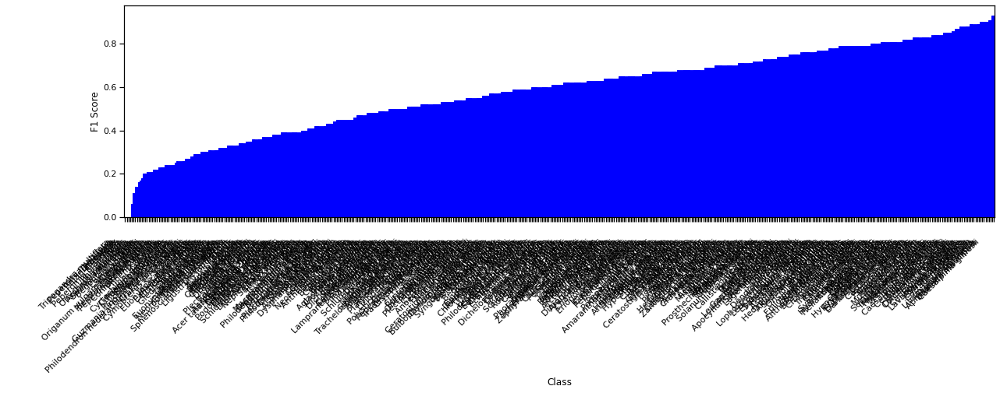

In [ ]:
import seaborn as sns
sns.set_palette("dark")
ordered_fscore = class_report[class_report['F1 Score']>=0].sort_values('F1 Score')
fig, ax = plt.subplots(figsize=(20,5))
sequential_colors = sns.dark_palette('blue', len(ordered_fscore))
chart = sns.barplot(ax=ax, x=ordered_fscore['Class'], y=ordered_fscore['F1 Score']);
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right');
for i, bar in enumerate(ax.patches):
    bar.set_color("blue")

# Clean the Data

There are two ways we can go about this now

1.   Use the plot_top_losses function to determine categories with significant problems, and manually look through the folders to fix images that we know are incorrect. 
2.   Use fastai v2's inbuilt convenience functions to help clean the dataset. However, due to RAM limitations we will need to look at the dataset one portion at a time. For this dataset, about 10% of the sample set can be loaded into the cleaning widget at once, but the main problem is looking through over 500 classes manually without knowing which ones have the most issues. 



In [ ]:
from fastai2.vision.widgets import *
from fastai2.vision.all import *

In [ ]:
def create_cleaning_df(path:str, pct_images=1, n_splits=10, split=0):
  '''
  Takes a path of a folder containing images within their subfolders. 
  Can return a subset of those folders (classes) for passing into the ImageClassifierCleaner
  '''
  data = []
  n_folders = len(sorted(os.listdir(path)))
  folder_bunch = n_folders//n_splits
  for folder in sorted(os.listdir(path))[(0+folder_bunch*split):(folder_bunch+folder_bunch*split)]:
      num_files = len(sorted(os.listdir(path+'/'+folder)))
      for file in sorted(os.listdir(path+'/'+folder)):
          data.append((folder, path+folder+'/'+file))
  df = pd.DataFrame(data, columns=['Class', 'Path'])
  return df

In [ ]:
# Recreate the dataframe but only take 10% of the data
df = create_cleaning_df('/content/plant_images_database/', pct_images=0.1, n_splits=10, split=0)
# Inner join this reduced dataframe to the previous splits to maintain the same training images
master_df = pd.read_csv('df_cnn_0.csv')
df_cnn_mini= df.merge(master_df, how = 'inner', on = ['Class','Path'])

In [ ]:
# Get file path and labels from the dataframe we set up
get_x = lambda x: x['Path']
get_y = lambda y: y['Class']
# Define custom split based on previous stratification
def stratifiedsplitter(df):      
    train = df.index[~df['is_valid']].tolist()
    valid = df.index[df['is_valid']].tolist()
    return train,valid   

In [ ]:
plants = DataBlock(blocks=(ImageBlock, CategoryBlock),
                  splitter=stratifiedsplitter,                                  # Random train/validation split
                  get_x=get_x,                                                  # Get the image path from dataframe
                  get_y=get_y,                                                  # Label from dataframe
                  item_tfms=RandomResizedCrop(512, min_scale = 0.7),            # Crop images to a square
                  batch_tfms=[*aug_transforms(size=224),                        # Resize, and use typical fastai image augmentation transforms
                              Normalize.from_stats(*imagenet_stats)])           # Normalize the images based on the imagenet stats

In [ ]:
dsets = plants.datasets(df_cnn_mini)
dsets.train[10]

(PILImage mode=RGB size=225x225, TensorCategory(0))

In [ ]:
dls = plants.dataloaders(df_cnn_mini, bs=64)
print(f'We are examining {dls.c} classes, with a training set of size {len(dls.train_ds)}, and a validation set of size {len(dls.valid_ds)}')
# Instantiate a learner and load in the trained weights
learn = cnn_learner(dls, resnet34, pretrained=True, metrics=error_rate, n_out=537).to_fp16()
learn.load('/content/drive/My Drive/Houseplant Classifier/Models - Deep Clean/stage-2-250images-deepclean');
# It is important to initialize and load as before as the ImageClassifierCleaner widget will be 
# making predictions on to determine top losses for each category for us to look at

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "


We are examining 537 classes, with a training set of size 10717, and a validation set of size 2708


In [ ]:
# This cleaner will take the top losses for each category and lets us see if there are any issues with the images and classification
cleaner = ImageClassifierCleaner(learn)

In [ ]:
cleaner

In [ ]:
# Run each time we finish looking at a set of images
# Physically deletes that image from the dataset
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [ ]:
# Run each time we finish looking at a set of images
# Physically moves incorrectly labelled images into the correct directory
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

# Notes

In [ ]:
learner.sched.plot()